In [ ]:
# import packages
import os
import torch 
import torchvision
import torch.nn as nn
import torchvision.transforms as transforms
import torch.optim as optim
import matplotlib.pyplot as plt
import torch.nn.functional as F
 
from torchvision import datasets
from torch.utils.data import DataLoader
from torchvision.utils import save_image
import os
from tifffile import imsave

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

from skimage.transform import rotate
from skimage.util import random_noise
from skimage.filters import gaussian
from scipy import ndimage

In [ ]:
"""Align crop images for Changhui and Jie's experiment data using the confocol
Use the gfp signal to preselect the in focus images 
"""
%matplotlib inline
import scipy.ndimage as ndimage
import matplotlib.patches as mpatches
from scipy.stats import linregress
import scipy.stats
import scipy.signal
import scipy.spatial
import pandas as pd
import numpy as np
import math, re, os
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import skimage
from sklearn import linear_model
from datetime import datetime
from skimage import filters
import skimage, skimage.io, skimage.feature
from skimage.feature import register_translation
from skimage.filters import roberts, sobel, scharr, prewitt
#from skimage.feature.register_translation import _upsampled_dft

from skimage.filters import threshold_otsu
from skimage.segmentation import clear_border
from skimage.measure import label, regionprops
from skimage.morphology import closing, square
from skimage.color import label2rgb

import glob
#from sklearn.datasets.samples_generator import make_blobs
from sklearn.mixture import GaussianMixture

from skimage.measure import label, regionprops

import time as Time
from skimage.morphology import remove_small_objects
from skimage.measure import find_contours
import scipy.ndimage as ndimage
from scipy import ndimage as ndi
import pylab
from skimage.segmentation import flood 
import cv2
import numpy as np
from statistics import stdev 

In [ ]:
def getFileList(file_dir_pattern):
    """Get the file lists organized by position, time into dictionary, z stacked images will be appended in as well
    that match the given file_dir_pattern
    Parameters:
    ============
    file_dir_pattern : pattern of the file including the directory
    """
    files = glob.glob(file_dir_pattern)
    image_files = {}
    pattern = re.compile(".*\/.*s(\d+)[t&z](\d+).*") # \d+ 0-9 digit repeats more than once, [t|z]- looks for t or z, *s any charecter that is not a whitespace
    for filename in sorted(files): # keep them sorted 
        #print filename
        match = pattern.match(filename)
        if match:
            pos = match.group(1).zfill(3) # zfill returns on the left and fills with 0
            time = int(match.group(2)) # returns the time
            image_files.setdefault(pos,{}) # .setdefault if key not in dic will make it 
            image_files[pos].setdefault(time, []) # setting the time dictionary as a list so i can append later 
            image_files[pos][time].append(filename)# double dict keys!
    return image_files

def quickaggre(poslist, timelist, dic_images, listype = None, gaus = None):
    """To sum the zstacks of a position or time, takes in multiple times and positions OR a singular time or position
    dic_images- are bf_images, rfp_images or gfp_images. made using Jiashuns getfilelist!
    listype MUST say True or False.
        True = means poslist and timelist must be written as list form: expample ['001', '002'] and [1,217,216] 
            notice that position is written as STRING and timelist is written as INT must be kept!
        False = means poslist and timelist are SINGULAR as such '001' and 217  
            again position is STRING timelist is int
    gaus if True will peform a gausian blur, this is used on GFP! to help remove background noise 
     example to call out one set : quickaggre('006', 100 , gfp_images, False, True)['006'][100 ] """
    aggdic ={}
    if listype is True:# for multiple times and positions 
        for time in timelist:
            for pos in poslist:
                first_stack = np.zeros((len(dic_images[pos][time]), 512, 512)) 
                for i,img in enumerate(dic_images[pos][time]):
                    first_stack[i, :, :] = skimage.io.imread(img,plugin='pil')
                    aggdic.setdefault(pos,{}) # .setdefault if key not in dic will make it 
                    if gaus is True:
                        stack = np.sum(first_stack, axis = 0)
                        aggdic[pos][time] = ndimage.gaussian_filter(stack, sigma = 1.5)
                    else:
                        aggdic[pos][time] = np.sum(first_stack, axis = 0) # lets you add all the images together 

    elif listype is None or listype is False: # for just one of the values position or time 
        first_stack = np.zeros((len(dic_images[poslist][timelist]), 512, 512)) 
        for i,img in enumerate(dic_images[poslist][timelist]):
            first_stack[i, :, :] = skimage.io.imread(img,plugin='pil')
            aggdic.setdefault(poslist,{}) # .setdefault if key not in dic will make it 
            if gaus is True:
                stack = np.sum(first_stack, axis = 0)
                aggdic[poslist][timelist] = ndimage.gaussian_filter(stack, sigma = 1.5)
            else:
                aggdic[poslist][timelist] = np.sum(first_stack, axis = 0) # lets you add all the images together 
    
        
    return aggdic


# for Netbf images path
    # this gives you the file path for each netbf that is made in refence to the position and time 
def netbfimages(filepath):
    """using the filpath given it will out put a dictionary that has the position and time in refence to the filepath"""
    dic = {}
    for filename in glob.glob(filepath ):
        file = filename.split('/')[-1] 
        pos = str(0)+file.split('_')[0]
        time = int(file.split('_')[1].replace('.npz', '')) # turning the string to a time 
        dic.setdefault(pos, {})
        dic[pos][time] = filename 

    return dic


# to load in individual netbfs
def quicknetbfagg(posref,timeref, netbf_images):
    """purpuse is to read in a netbf file individually. will be useful if you want to read just one
    posref- must be string 
    timeref - must be interger 
    netbf_images- is the dictionary that contains the file path names
    example = quicknetbfagg('001',1, netbf_images)['001'][1]  """
    
    netdic = {}
    for filename in glob.glob(netbf_images[posref][timeref]):
        file = filename.split('/')[-1] 
        pos = str(0)+file.split('_')[0]
        time = int(file.split('_')[1].replace('.npz', '')) # turning the string to a time 
        if (pos == posref) & (time == timeref):
            data =  np.load(str(filename))
            data = data['pixels']
            first_stack = np.zeros((data.shape[0], 512, 512)) # making file for zstack 
            for i in range(0,data.shape[0],1):
                first_stack[i, :, :] = data[i, :,:,1]
                netdic.setdefault(pos,{}) # .setdefault if key not in dic will make it 
                    # normalizing the zstack images
                netdic[pos][time] = np.sum(first_stack, axis = 0) 
 
    return netdic

def backsub(background, dataframe):
    'for background normalizations'
    dfmerge = pd.DataFrame(index = background.index)
    for col in background.columns:
        colcell = 'pos_' +str(col)+'_'
        collist = dataframe.columns.str.startswith(colcell)
        df1 = dataframe.loc[:,collist]
        df2 = df1.sub(background[col], axis='index')
        dfmerge = dfmerge.merge(df2, on = 'time', how = 'outer')
        dfmerge.columns.name = 'position' # need to add position back to all column names 
    return dfmerge

# to load files into a dictionary format 

# files you want to use 
import pickle
import bz2

# add the files you want
listfiles = ['rfpsumdf_','gfpsumdfori_', 'r2timedf_', 'areamaskdf_',
            'volumedf_', 'gfpGMmaxdfori_', 'infodf_','backmeandfgfp_',\
             "backmeanlszstackgfp_", 'volume5gfp_', 'backmedianlszstackgfp_'] # 'gfpsumzstackori_'
# 'bay5zstack_'

def makedatadic(listfiles, date, outfilename, normalize = True):
    '''purpose is to place my dataframe in a dictonary so that I can use it later 
    listfiles - this has a list of the files you want have to add _ as it i staken
    date-the date of where it is stored
    outfilename- the file path '''
    dic = {}
    for datafile in listfiles:
        try:
            namefile = datafile.split('_')[0]

            file = outfilename +str(datafile) +str(date)+".pkl"
            with open(file,'rb')\
                as data:
                dic[namefile] = pickle.load(data)
    
        except:
            pass
        if normalize is True:
            try:
 
                for key in list(dic.keys()):# making a new df that has gfp normalized 

                    
                    if key.startswith('gfp') and not key.endswith('backsub'): # to get only those with gfp but not repeat hence backsub
                        newkey = str(str(key)+'backsub')
                        dic[newkey] = backsub(dic['backmeandfgfp'], dic[key])

                    if key.startswith('rfp') and not key.endswith('backsub') : # normalizing and making a new df that has RFP removed 
                        newkey = str(str(key)+'backsub')
                        dic[newkey] = backsub(dic['backmeandfgfp'], dic[key])
            except:
                pass
 
    return dic 


In [ ]:
def addstraintocol (df1, r2timedf1, filterpos = None):
    """purpose is to add strain name
    example :
    addstraintocol(gfpsumdf , r2timedf_11_8_19 , use)
    or 
    (gfpsumdf , r2timedf_11_8_19 )
    df = gfpsumdf_11_21_19, columns must have the position 
    r2timedf = r2timedf_11_21_19 on the rows on the position is the matching columns 
    filterpos = it is a filtered set of positions should be in list format """
    df = df1.copy()
    r2timedf = r2timedf1.copy()
    if 'name' not in r2timedf.columns:
        r2timedf['name'] = r2timedf['position'].astype(str) + '_'+r2timedf['strain'].astype(str)
    if filterpos is None:
        if sum(r2timedf['position'].values == df.columns) == len(df.columns):
            df.columns = r2timedf['name'] 
    elif filterpos is not None:
        r2timedf = r2timedf.loc[r2timedf['position'].isin(filterpos), :]
        df = df.loc[:, filterpos]
        if sum(r2timedf['position'].values == df.columns) == len(df.columns):
            df.columns = r2timedf['name'] 
    return df

def straincountcelladd(countcells, r2timedf, method = 'name'):
    """purpose is to add a strain name on to the countcellsdf Dataframe"""
    inputcell = countcells.copy().astype(int)
    inputcell = inputcell.reset_index()
    inputcell['name'] = 'na'
    for pos in countcells.index.unique():
        rows = inputcell['position'] == pos
        rowr2 =  r2timedf['position'] == pos
        inputcell.loc[rows,'name'] = r2timedf.iloc[np.where(r2timedf['position'] == pos)]['name'].tolist()[0]
    if method == 'name':
        inputcell = inputcell.set_index('name')
    if method == 'position':
        inputcell = inputcell.set_index('position')
    return inputcell 

def RLScountdf(countcells, r2timedf):
    """purpose is to determine when RLS ends, this is done by taking the cells found for each position overtime
    and returning the position, time and cellnumber that had the first time showing the highest number of cells
    """
    if 'name' not in r2timedf.columns:
        r2timedf['name'] = r2timedf['position'].astype(str) + '_'+r2timedf['strain'].astype(str)
        
    # adding name of strain into the cell 
    inputcell = countcells.copy().astype(int)
    inputcell = inputcell.reset_index()
    inputcell['name'] = 'na'
    for pos in countcells.index.unique():
        rows = inputcell['position'] == pos
        rowr2 =  r2timedf['position'] == pos
        inputcell.loc[rows,'name'] = r2timedf.iloc[np.where(r2timedf['position'] == pos)]['name'].tolist()[0]
    
    # filtering by nlargest cell 
    l = []
    inputcell =  inputcell.set_index('position')
    for pos in inputcell.index.unique(): 
        l.extend(inputcell.loc[pos,].nlargest(1, 'cell_number', keep='first').reset_index().values.tolist())
    df = pd.DataFrame(l)
    df.columns = ['position', 'time', 'cell_number', 'name']
    df = df.set_index('position')
    
    
    return df

def filterdata(gfpsumdf , rls, pos, r2timedf = None, name = True, skip = False):
    """using RLS dataframe that has already been filtered this will output a dataframe from the time of start to the last 
    time of RLS or basically the last daughter being generated
    gfpsumdf = dataframe that has the gfpsumdf, can have strain name added to columns as well. if so edit the info
    rls- is the countcells that have been filtered for the highest cells found at the last time point
    pos- is the position you want 
    r2timedf = has the strain and names 
    
    examples:
    filterdata(gfpsumdf , rls, pos, r2timedf) - use this if you want the strain name added
    filterdata(gfpsumdf, rls, pos, r2timedf= None, name =False, skip = False)- use this if you DO NOT WANT STRAIN NAME 
    """
    
    if (name == True) and (skip == False):
        if len(rls.index[1].split('_')[:4]) < 5: # adding a strain name if it is missing 
            df = addstraintocol(gfpsumdf , r2timedf )
        else:
            df = gfpsumdf
        time = rls.loc[rls['name'] == pos]['time'][0]
        df = df.loc[:time,:]
    elif (name == False) and (r2timedf == None) and (skip == False):
        pos = pos.split('_')[:4] # just in case any string like _hsp104 is being added to the orginal pos
        pos = '_'.join(pos)
        time = rls.loc[pos]['time']
        df = gfpsumdf.loc[:time,:]
    elif (skip == True): # if you have a datarame that has the strain names added already 
        time = rls.loc[rls['name'] == pos]['time'][0]
        df = gfpsumdf.loc[:time,: ]
        
    return df
    
def corrdf(gfpsumdf, rls, method = 'pearson', na = None):
    """purpose is to peform cross correlation
    heare you input your merged dataframe or dataframe that HAS THE NAME OF STRAIN!
    rls- is the df that has the last time that gives the max count
    method - lets you pick spearman or pearson, pearson by default
    """
 
    rlist = []
    plist = []
    sdevlist = []
    inputgfp = gfpsumdf.copy()
    if method == None:
        rdf = inputgfp.corr()
        pdf = inputgfp.corr()
    sharedcol = set(rls['name']) & set(inputgfp.columns)
    for col in sharedcol:
        time = rls.loc[rls['name'] == col]['time'].values.tolist()[0]
        x = inputgfp.loc[:time, col]
        for col2 in sharedcol:
            time2 = rls.loc[rls['name'] == col2]['time'].values.tolist()[0]
            y = inputgfp.loc[:time, col2]
            if method == 'pearson':
                r, p = scipy.stats.pearsonr(x, y)
            elif method == 'spearman':
                r, p = scipy.stats.spearmanr(x, y)
            #sd = np.std(x,y)
            rlist.append([col, col2, r])
            plist.append([col, col2, p])
            #sdevlist.append([col,col2, sd])
    rdf = pd.DataFrame(rlist)
    pdf = pd.DataFrame(plist)
    #sddf = pd.DataFrame(sdevlist)
    rdf.columns = ['name_1', 'name_2', 'value']
    pdf.columns = ['name_1', 'name_2', 'value']
    #sddf.columns = ['name_1', 'name_2', 'value']
    if na == None: # some values have NAs so here I
        rdf = rdf.pivot(index = 'name_1', columns = 'name_2')['value'].dropna(how= 'all').dropna('columns')
        pdf = pdf.pivot(index = 'name_1', columns = 'name_2')['value'].dropna(how= 'all').dropna('columns')
    else :
        rdf = rdf.pivot(index = 'name_1', columns = 'name_2')['value'] 
        pdf = pdf.pivot(index = 'name_1', columns = 'name_2')['value'] 
 
        
    #sddf = sddf.pivot(index = 'name_1', columns = 'name_2')['value'].dropna()
    return rdf, pdf#, sddf

def detectmask(infodf, df_images, name, time, pic = False, zoom = True):
    """ to plot mask and get the value
    infodf - is the info file that has the coordinates of the mask 
    df-images - can be rfp, gfp or brightfield Note this is using Gaussian blur to see the images
    name - must be either '001' or 'pos_001_cell_1' can take either format if '001' used multipel masks shown
    time - is the tiem frame 
    pic = False by default will load the images if TRUE than put in any input image numpy array! 
        Example: detectmask(infodf_11_8_19, pic, 'pos_001_cell_1', 4, True)
            pic here REPLACES the df_images as we are not loading an image but putting a numpy array instead 
    example_input: detectmask(infodf, df_images, name, time)
    example: detectmask(infodf_11_8_19, gfp_images_11_8_19, '001', 4) - for multiple
    example: detectmask(infodf_11_8_19, gfp_images_11_8_19, 'pos_001_cell_1', 4) - for single"""
    if 'position' in infodf.columns:
        infodf = infodf.set_index('position')
    cols = infodf.loc[infodf.index.str.startswith(('pos_'+str(name), name))].index.unique().values # get all or one of the column names
    infodf1 = infodf.reset_index()
    infodf1 = infodf1.groupby(by = ['position', 'time']) # grouping by name 
    df = np.zeros((512,512))
    if len(cols)> 2:
        for col in cols:
            infodf2 = infodf1.get_group((col, time))
            poly = infodf2['coords'].iloc[0]
            df[poly[:, 0], poly[:, 1]] = 1
            shift = infodf2['shift'].values[0]
            #x = int(infodf2['circle_center_x'].values)
            #y = int(infodf2['circle_center_y'].values)
            #plt.text(x,y, col, fontsize=12,ha='center', color = 'white' )
            pos = col.split('_')[1]
            # y coordinate to zoom in the picture 
            ymin = pd.DataFrame(infodf2['coords'].iloc[0])[0].min()
            ymin1 = pd.DataFrame(infodf2['coords'].iloc[0])[0].max()
            # x coordinate to zoom in the picture 
            xmin = pd.DataFrame(infodf2['coords'].iloc[0])[1].min()
            xmin1 = pd.DataFrame(infodf2['coords'].iloc[0])[1].max()
    else:
        infodf1 = infodf1.get_group((name, time))
        poly = infodf1['coords'].iloc[0]
        df[poly[:, 0], poly[:, 1]] = 1
        shift = infodf1['shift'].values[0]
        #x = int(infodf1['circle_center_x'].values)
        #y = int(infodf1['circle_center_y'].values)
        #plt.text(x,y, name, fontsize=12, color = 'white' )
        pos = name.split('_')[1]
        
        # y coordinate to zoom in the picture 
        ymin = pd.DataFrame(infodf1['coords'].iloc[0])[0].min()
        ymin1 = pd.DataFrame(infodf1['coords'].iloc[0])[0].max()
        # x coordinate to zoom in the picture 
        xmin = pd.DataFrame(infodf1['coords'].iloc[0])[1].min()
        xmin1 = pd.DataFrame(infodf1['coords'].iloc[0])[1].max()

    if pic == False:
        pic = quickaggre(pos,time, df_images, False, True)[pos][time]
    else:
        pic = df_images
    pic = np.roll(pic, int(shift[0]), axis = 0)
    pic = np.roll(pic, int(shift[1]), axis = 1)
    
    #df = np.roll(df, int(shift[0]), axis = 0)
    #df = np.roll(pic, int(shift[1]), axis = 1)
    
    try:
        contours = find_contours(df, .5) # finds the corresponding peaks and draws it on the picture
        for contour in contours:
            plt.plot(contour[:, 1], contour[:, 0], linewidth=2, color='b')
    except:
        pass

    if zoom == True:
        plt.ylim([ymin1 ,ymin])
        plt.xlim([xmin, xmin1])
    plt.imshow(pic)
    
    
def proteinpic (cell, time, gfp_images, gfpGMmax):
    """Here i am using the gaussian mixture model and selecting values that are higher for that mean that is calculated"""
    pos = cell.split('_')[1]
    gfppic = quickaggre(pos, time, gfp_images, False, True)[pos][time]
    thresh = gfpGMmax.loc[time,cell ]
    pic = gfppic  >= thresh
    return pic


def findJZmask(infodf, budding, alignment):
    """purpuse is to take JZ's budding data and determine which of my cells align with his, the output
    will be a dataframe that has my cell label and JZ's cell labels along with the times of budding and 
    the sum of the budding 
    infodf- is the info file made that contains information on my mask and its coordinates
    budding is the specific file made by JZ tha thas the budding rates and times
    alignment- is another JZ file made that has the cells aligned. 
    
    example: findJZmask(infodf_10_16_19, budding, alignment)"""
    
    l = pd.DataFrame(list(infodf.reset_index()['position'].str.split('_')))[1].unique() 
    l = infodf.reset_index()['position'].unique()
    newjz = []
    inputinfo = infodf.reset_index() #.groupby('time')['coords']
    budding['name'] = budding['pos'].astype(str) + '_' + budding['label'].astype(str)
    for pos in l:
        x = inputinfo.loc[(inputinfo['position'] == pos) & (inputinfo['time'] == 3)]['coords'].iloc[0] 
        df = np.zeros((512,512))
        df[x[:,0], x[:,1]] =1

        posnumb = pos.split('_')[1]
        numbcell = pos.split('_')[3]

        for namejz in budding.loc[budding['pos'] == int(posnumb)]['name'].unique():
            labelnumb = int(namejz.split('_')[1])
            #x = budding.loc[(budding['name'] == namejz) & (budding['state'] == 'S')] 
            cell = budding[(budding['pos']==int(posnumb)) & (budding['label']==labelnumb)]

            #for i in range(16):
            # get the corresponding shift and apply it back to the boundary of cell
            shift = alignment[(alignment['pos']==(int(posnumb))) & (alignment['t1']==1)]
            if shift.shape[0] > 0:
                adj_x = shift.values[0, -1]
                adj_y = shift.values[0, -2]
                bx = [float(x) - adj_x for x in cell.iloc[1]['bx'].split(',')]
                by = [float(y) - adj_y for y in cell.iloc[1]['by'].split(',')]
                cx = cell.iloc[1]['x']
                cy = cell.iloc[1]['y']
            else:
                bx = [float(x) for x in cell.iloc[1]['bx'].split(',')]
                by = [float(y) for y in cell.iloc[1]['by'].split(',')]
                cx = cell.iloc[1]['x']
                cy = cell.iloc[1]['y']

            boundary = np.zeros((len(bx), 2))
            boundary[:, 0] = by
            boundary[:, 1] = bx

            hull = scipy.spatial.ConvexHull(boundary)
            cellbody_y, cellbody_x = skimage.draw.polygon(\
                         boundary[hull.vertices, 0], boundary[hull.vertices,1])
            cellbody = np.zeros((512,512),dtype=np.uint16)
            cellbody[cellbody_y, cellbody_x]=1

            if np.sum(np.logical_and(df, cellbody)) > 0:
                timeslist = budding.loc[(budding['name'] == namejz) & (budding['state'] == 'S')]['time'].values
                amountlist = budding.loc[(budding['name'] == namejz) & (budding['state'] == 'S')].shape[0]
                newjz.append([pos, namejz,amountlist, timeslist])

    newjz = pd.DataFrame(newjz)
    newjz.columns = ['position', 'jz_name', 'budding_sum', 'time_budding']
    newjz = newjz.sort_values('budding_sum', ascending = False).drop_duplicates(subset='position', keep='first')
    newjz = newjz.sort_values('budding_sum', ascending = False).drop_duplicates(subset='jz_name', keep='first')
    
    newjz = newjz.sort_values('position')
    newjz = newjz.set_index('position')
    return newjz


def rlsjz(newjz, r2timedf):
    """purpose is to format JZ's budding data to my dataframe format of RLS so I can use it later on
    newjz- is the dataframe made using the function findJZmask(infodf, budding, alignment) which 
    matches JZ's cells with mine
    r2timedf is the r2 values that have the actual names of the strains
    example: rlsjz(newjz_10_16_19, r2timedf_10_16_19) """
    l = []
    for index in newjz.index:
        if  newjz.loc[index,'budding_sum'] == 0:
            maxtime = 1
        else:
            maxtime = np.max(newjz.loc[index,'time_budding'])
        cell_number = np.max(newjz.loc[index,'budding_sum'])
        name = r2timedf.loc[r2timedf['position']== index]['name'].values[0]
        l.append([index,maxtime,cell_number,name])
    rlsjzdf = pd.DataFrame(l)
    rlsjzdf.columns = ['position', 'time', 'cell_number', 'name']
    rlsjzdf = rlsjzdf.set_index('position')
    return rlsjzdf

In [ ]:
def top5sumdic(df_images,dic,pos,time, topnumb, c1 = None):
    """function is made to aggregate the top 5 zstacks of a cell. Basically you must already have a df that 
    states which zstack images are the top for a particular mother cell. 
    This was made after investigating the individual z stacks 
    
    This does NOT peform any translations but only sums the pictures. 
    
    df_images = should be dictionaries containing the image links for gfp_images, bf_images, or rfp images
    dic - this is your dictionary that stores the different dataframes gfp, or infodf and rls information
    pos - the position you are interested in 
    top - df that highlights the mother cells top zstack images
    topnumb - top zstacks you want like the top 5
    example = top5sumdic(gfp_images_2_27_20,f2_27_20,'017',127, 5)
    
    returns : a dataframe contianing the top 5 zstacks and time and position 
            : a dictionary contianing the mother cell example dic['pos_018_cell_1']
    """
    
    top = []
    topdic = {}
    aggdic= {}
    infodf = dic['infodf']
    infodf1 = infodf.set_index('position')# using the info file containg the mothers mask 
    cols = infodf1.loc[infodf1.index.str.startswith(('pos_'+str(pos), pos))].index.unique().values # get all or one of the column names
    infodf1 = infodf1.reset_index()
    infodf1 = infodf1.groupby(by = ['position', 'time']) # grouping by name 



    infodf2 = infodf1.get_group((cols[0], time)) # every cell of the same position should have the same shift
    shift = infodf2['shift'].values[0]


    allmasks = np.zeros((512,512))
    for col in cols:
        if len(cols) <= 1: # for any positin columns that have only 1 cell 
            if col == cols:
                continue 
            else:
                col = cols
        infodf2 = infodf1.get_group((col, time))
        poly = infodf2['coords'].iloc[0]
        allmasks[poly[:, 0], poly[:, 1]] = 1
    allmasks = allmasks > 0 


    # using  information from masks to create a dataframe for the top zstacks
    for col in cols:
        if len(cols) <= 1: # for any positin columns that have only 1 cell 
            if col == cols:
                continue 
            else:
                col = cols
        for zstacknumber, z in enumerate(sorted(df_images[pos][time])):  # moved zstack under so I can do a better visualization
            zstacknumber = zstacknumber +1
            img =skimage.io.imread(z,plugin='pil')  # reading in one z stack image at a time


            # assigning pic an img 
            background = dic['backmedianlszstackgfp'].loc[time].loc[zstacknumber, col]
            pic = img.copy() -background # no gaussian filter 
            pic[pic<0] = 0 # turning negatives after background to 0 

            # shifting image to match the masks
            pic = np.roll(pic, int(shift[0]), axis = 0)
            pic = np.roll(pic, int(shift[1]), axis = 1)

            df = np.zeros((512,512)) # empty image
            infodf2 = infodf1.get_group((col, time))
            poly = infodf2['coords'].iloc[0]
            df[poly[:, 0], poly[:, 1]] = 1

            pos = col.split('_')[1]
            position = infodf2['position'].values[0]

            mothercell = df > 0 



            picorginal = pic.copy() 
            pic =ndimage.gaussian_filter(pic, sigma = 1.5, truncate = 4) # W= 2(truncate*sigma +.5) +1


            mask = pic[mothercell]


            # y coordinate to zoom in the picture 
            ymin = pd.DataFrame(infodf2['coords'].iloc[0])[0].min()
            ymin1 = pd.DataFrame(infodf2['coords'].iloc[0])[0].max()
            # x coordinate to zoom in the picture 
            xmin = pd.DataFrame(infodf2['coords'].iloc[0])[1].min()
            xmin1 = pd.DataFrame(infodf2['coords'].iloc[0])[1].max()

            thresh1 = np.mean(mask) #+(np.std(mask)*1) # threshold to find pixels 

            valthresh = pic[pic >= thresh1].mean()

            top.append([pos,time,zstacknumber,(col), valthresh, z])
    top = pd.DataFrame(top)
    top.columns = ['pos', 'time', 'zstack','name', 'abovemean', 'z_link']

    # summing the top 5 zstacks together     
    for col in cols:
        if len(cols) <= 1: # for any positin columns that have only 1 cell 
            if col == cols:
                continue 
            else:
                col = cols

        top5 = top.groupby('name').get_group(col).nlargest(topnumb, 'abovemean')['z_link'].values ### top 5
        
        
        ## coordinating the pictures
        infodf2 = infodf1.get_group((col, time))
        # y coordinate to zoom in the picture 
        ymin = pd.DataFrame(infodf2['coords'].iloc[0])[0].min()
        ymin1 = pd.DataFrame(infodf2['coords'].iloc[0])[0].max()
        # x coordinate to zoom in the picture 
        xmin = pd.DataFrame(infodf2['coords'].iloc[0])[1].min()
        xmin1 = pd.DataFrame(infodf2['coords'].iloc[0])[1].max()

        first_stack = np.zeros((len(top5), 512, 512))     
        for i,img in enumerate( top5):  # moved zstack under so I can do a better visualization
            zstacknumber = int(img.split('z')[1].split('c')[0])
            if c1 == None:
                background = dic['backmedianlszstackgfp'].loc[time].loc[zstacknumber, col]
            elif c1 == 'rfp':
                background = dic['backmedianlszstackrfp'].loc[time].loc[zstacknumber, col]
            elif c1 =='bf':
                pass   
            pic = skimage.io.imread(img,plugin='pil')
            
            if c1 != 'bf':
                pic = pic -background # no gaussian filter 
                pic[pic<0] = 0 # turning negatives after background to 0 
            first_stack[i, :, :] = pic
            aggdic.setdefault(col,{}) # .setdefault if key not in dic will make it 
            #aggdic[col] = np.sum(first_stack, axis = 0)
            picsum = np.sum(first_stack, axis = 0)
            #shift and focus on one single cell
            picsum = np.roll(picsum, int(shift[0]), axis = 0)
            picsum= np.roll(picsum, int(shift[1]), axis = 1)
            picsum = cv2.resize(picsum[ymin:ymin1, xmin:xmin1], (40, 40)) # getting mother cell and creating a 40X40 image
            #picsum =((picsum) - np.min(picsum))/np.max(picsum) *1 # normalize it to 0 to 1
            aggdic[col] =picsum
    return top, aggdic

# Loading in Dataset and making Training and testing
This code was optimzied to work with Google colabs 

In [ ]:
##### import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, datasets, models
from torch.utils.data import DataLoader, random_split
import matplotlib.pyplot as plt
import numpy as np
import helper
from PIL import Image, ImageDraw
from scipy import ndimage as ndi
from skimage.morphology import remove_small_objects
from skimage.color import rgba2rgb
from skimage import data
import os 
import tifffile as tiff
import torch.optim as optim
import torch.nn.functional as F
import copy
import tensorflow as tf
from skimage.filters import threshold_otsu

In [ ]:
 from google.colab import drive
drive.mount('/content/drive') # mounting google drive so I can access files and save files 
os.chdir('/content/drive/My Drive/') # changing Directories so that this is the default 

Mounted at /content/drive


In [ ]:
import os

# define the name of the directory to be created
path = os.getcwd() + '/training_data'
path1= os.getcwd() + '/training_data/gfp'
path2 = os.getcwd() + '/training_data/rfp'
path3 = os.getcwd() + '/training_data/mask'
try:
    os.mkdir(path)
    os.mkdir(path1)
    os.mkdir(path2)
    os.mkdir(path3)
except OSError:
    print ("Creation of the directory %s failed" % path)
else:
    print ("Successfully created the directory %s " % path)


Creation of the directory /content/drive/My Drive/training_data failed


In [ ]:
path = os.getcwd()+'/training_data/' 
os.chdir(path)
os.getcwd()

'/content/drive/My Drive/training_data'

In [ ]:
!wget http:/training_data_Mitochondria_COX4.tar.gz -P /drive/STRP  # dataset is 40X40 and was made by a training pipeline
!mkdir /drive/STRP/mito/
!tar zxf /drive/STRP/training_data_Mitochondria_COX4.tar.gz -C /drive/STRP/mito

In [ ]:
from sklearn.utils import shuffle
'this is making a dataframe that will house all the files and split it randomly into training and test dataset afterwards I can always load in the same training or testing dataset'

datainfo = 'cox4_6_22_21' #'vma1_11_3_21'#'cox4_6_22_21' # for saving datafiles 
l = []
path1 = filepath =  '/drive/STRP/mito/training_data_Mitochondria_COX4/gfp/' # 
pattern = re.compile('.*cell_(\d+)-63x.*s(\d+)t(\d+)z(\d+)c(\d)_ORG.tif')
for file in os.listdir(path1):
    match = pattern.match(file)
    if match:
        cell = int(match.group(1)) #which cell in that position
        pos = int(match.group(2)) #position
        frame = int(match.group(3)) #time
        z = int(match.group(4)) #which z
        channel = int(match.group(4)) #channel
    
    
        l.append({'cell':cell, 'pos': pos, 'time': frame, 'zstack': z,'channel':channel ,'file': file})
filedf = pd.DataFrame(l)
filedf = shuffle(filedf) # shuffle your data

# splitting dataframes
traindf = filedf.sample(frac = .8) # keeping 80% of the data
testdf = filedf.drop(traindf.index) # putting the other 20% in testing 

print('total dataset {}'.format(filedf.shape[0]))
print('traindf dataset samples {}'.format(traindf.shape[0]))
print('testdf dataset samples {}'.format(testdf.shape[0]))
print('testdf+traindf= {}'.format(testdf.shape[0]+traindf.shape[0]))

total dataset 15048
traindf dataset samples 12038
testdf dataset samples 3010
testdf+traindf= 15048


# saving training and Testing Df so we can reuse it. 
datainfo = 'vma1_11_3_21'#'mdm38_6_22_20'
traindf.to_csv(os.getcwd()+'/'+'train_dataset_{}.csv'.format(datainfo), sep = '\t' , index = True) # index true saves without index so 'unamed:0'
testdf.to_csv(os.getcwd()+'/'+'test_dataset_{}.csv'.format(datainfo), sep = '\t', index = True ) 
filedf .to_csv(os.getcwd()+'/'+'all_dataset_{}.csv'.format(datainfo), sep = '\t' , index = True)  

In [ ]:
os.getcwd()

'/content/drive/My Drive/training_data'

In [ ]:
## load the Dataframes for Testing and train
traindf = pd.read_csv(os.getcwd()+'/'+'train_dataset_{}.csv'.format(datainfo), sep = '\t', index_col=0) # index_col loads it in with the index shuffled as is 
testdf =pd.read_csv(os.getcwd()+'/'+'test_dataset_{}.csv'.format(datainfo), sep = '\t', index_col=0)
filedf =pd.read_csv(os.getcwd()+'/'+'all_dataset_{}.csv'.format(datainfo), sep = '\t', index_col=0)
rlsdf = pd.read_csv(os.getcwd()+'/'+'Mitochondria_COX4_daughter_cells.csv', sep = '\t', index_col=0)
rlsdf = rlsdf.set_index('position')


In [ ]:
from itertools import repeat
def loaddata(df, filepath, threshold = True, resize = (40,40)):
    """ enter in a dataframe with the filename and filepath will be read in 
    the file will then be resized default is 40X40 and normalized from 0-1 if it is not done already
    you then have an option to peform a threshold
    df - dataframe wtih a column that has the actual filename
    filepath- the folder where to find the files
    threshold - default is True will create a mask of the channel using the mean threshold and .2*std over 
    resize = if you want to make the images a specific size """
    image_stack = np.zeros((df.shape[0], resize[0], resize[1])) 
    mask_stack= np.zeros((df.shape[0],1, 1))  
    for row in list(range(0,df.shape[0])):
        file = df.iloc[[row]]['file'].values[0] # getting the file from the dataframe 
    
        image = skimage.io.imread(filepath+ '/'+ file) #Image.open(img_name) # open the image using the path
        if image.shape != resize: # resizing the image to whatever 
            image = cv2.resize(image, resize) 
        
        # if the image is not normalzie it will be normalzied 
        if (image.min() != 0)  or (image.max() != 1):
            image = (image - np.min(image))/ (np.max(image) -np.min(image)) # normalize it to 0-1

        image = image.astype(np.float32) # musthave as float so that tensorflow views it as a float not double or numpy array

        # peforming thresholding
            # threshold is done after normalization 
        thresh = np.mean(image) +(np.std(image)*.2)
        mask = image >= thresh
        if threshold is True:
          image[~mask] = 0 # just turn everything else to 0 but leave the high intesnity values the same 
          #image[mask] = 1  


        # assigning the phenotype 
        if '_' in file:
            mask = 0
        #elif 'senecent_' in file:
         #   mask = 1
        #elif 'cytoplasm_' in file:
         #   mask = 2
        
        
        image_stack[row,:,:] = image
        mask_stack[row,:,:] =   int(mask)
        # for transformations 
        
    #image =  transform(image) # apply any transforms to turn to tensor flow 
    #image_stack = tf.convert_to_tensor(image_stack, np.float32)
 

    return [image_stack, mask_stack]

 
def imageDataGenerator(image_stack, masklabel):
    """ this will increase your dataset by rotating, flipping, and adding noise 
    will increase your dataset 7 times! 
    rotating 45, 90, 135, 224, 270 degrees
    will return a numpy array to a tensorflow """
    final_data = []
    mask_data =[]
    for i in list(range(0,image_stack.shape[0])):
        rotations = [0,45,90,135,225,270,180]
        index = 0
        for rotation in rotations:
          index = index +1
          rotateimg = rotate(image_stack[i], angle=rotation, mode = 'wrap') 
          resizeimg = cv2.resize(rotateimg[5:35,5:35], rotateimg.shape) 
          gausianimg = ndi.gaussian_filter(rotateimg, sigma = 2) 
          randomnoiseimg = random_noise(rotateimg,var=0.2**2) 
          
          transl1 = scipy.ndimage.shift(rotateimg, [4,4])
          transl2 =scipy.ndimage.shift(rotateimg, [-4,-4])
          transl3 =scipy.ndimage.shift(rotateimg, [4,-4])
          transl4 =scipy.ndimage.shift(rotateimg, [-4,4]) 

          #shuffling data
          mask = rotateimg>0
          arr = rotateimg[mask].copy()
          np.random.shuffle(arr)
          shufflimg = rotateimg.copy()
          shufflimg[mask] = arr
          # appending it to the list
          final_data.append(rotateimg.astype(np.float32)) 
          final_data.append(resizeimg.astype(np.float32))
          final_data.append(gausianimg.astype(np.float32))
          final_data.append(randomnoiseimg.astype(np.float32))
          final_data.append(shufflimg.astype(np.float32))

          final_data.append(transl1.astype(np.float32))
          final_data.append(transl2.astype(np.float32))
          final_data.append(transl3.astype(np.float32))
          final_data.append(transl4.astype(np.float32))




        #mask_data.append(masklabel[i])
        repeated_times = index *9 # how many times to repeat a mask label
        mask_data.extend([int(masklabel[i][0][0])  for t in range(repeated_times) ]) # need into to stop dtype from being float 
    mask_data = np.array(mask_data)
    final_data = np.array(final_data) # turn to a numpy array
    
    datalabel = []
    shapes = image_stack[i].shape
    for i in range(final_data.shape[0]):
        datalabel.append([final_data[i].reshape(1,shapes[0],shapes[1]), mask_data[i]])

 
    final_data =datalabel
    
    # turn images into tensorflow 
    #final_data  = torch.from_numpy([final_data])
    #final_data = final_data.float()
    
    
    return final_data

#torch.Size([100, 1, 40, 40])
 

In [ ]:
# loading in your dataset from the DataFrame
train_set, mask_stack1 = loaddata(traindf,path1 ) # default turns images to 40X40 unless resize is changed 
val_set, mask_stack2 = loaddata(testdf,path1 )

# increasing your dataset by 8 Fold
train_dataset =imageDataGenerator(train_set,mask_stack1)
test_dataset =imageDataGenerator(val_set, mask_stack2)

batch_size = 50 #dividng your whole data in batches 
dataloaders = {
    'train': DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2),
    'val': DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
}
 
# seperating the dataset
train_loader = dataloaders['train'] 
test_loader = dataloaders['val'] 

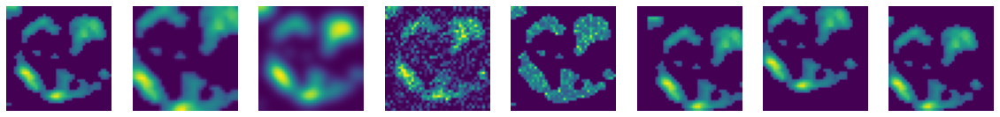

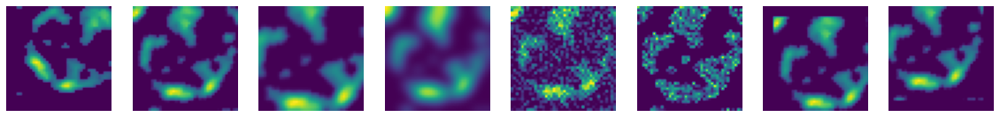

In [ ]:
# compare train_dataset 
    # this should have the image augmented datasets 
fig,ax = plt.subplots(1,8,figsize=(20,20))
for i in range(8):
    ax[i].imshow(train_dataset[i][0].reshape(40,40))
    ax[i].axis('off')
    
fig,ax = plt.subplots(1,8,figsize=(20,20))
for i in range(8):
    ax[i].imshow(train_dataset[i+8][0].reshape(40,40))
    ax[i].axis('off')

torch.Size([50, 1, 40, 40]) torch.Size([50])
label tensor(0)


torch.Size([50, 1, 40, 40])

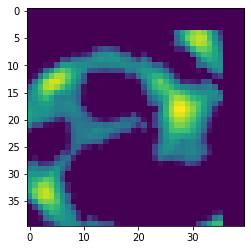

In [ ]:
# Get a batch of training data
inputs, masks = next(iter(dataloaders['train']))

print(inputs.shape, masks.shape)
#f, (ax1, ax2) = plt.subplots(1,2, figsize = (10,10))
plt.imshow(inputs[0][0] )
print('label', masks[0])
#ax1.imshow(inputs[0][0])
#ax2.imshow(masks[0][0])

# grab a batch from the train loader
batch, classes = next(iter(train_loader))
batch.shape

In [ ]:
# utility functions
def get_device():
    if torch.cuda.is_available():
        device = 'cuda:0'
    else:
        device = 'cpu'
    return device
def make_dir():
    image_dir = 'Other'
    if not os.path.exists(image_dir):
        os.makedirs(image_dir)
def save_decoded_image(img, epoch):
    img = img.view(img.size(0), 1, 40, 40)
    save_image(img, os.getcwd()+'/linear_ae_image{}.png'.format(epoch))

# VAE
Here I am just implementing a typical VAE that was made for the MINDST Dataset no major changes were made. I previously tried changing the B function for it but it failed. 

https://colab.research.google.com/github/smartgeometry-ucl/dl4g/blob/master/variational_autoencoder.ipynb#scrollTo=8XzIYNc9sQT1

In [ ]:
# 2-d latent space, parameter count in same order of magnitude
# as in the original VAE paper (VAE paper has about 3x as many)
latent_dims = 2
num_epochs = 100
batch_size = 100
capacity = 64
learning_rate = 1e-3
variational_beta = 1 # typically a value bigger than 1 
use_gpu = False

# # 10-d latent space, for comparison with non-variational auto-encoder
# latent_dims = 10
# num_epochs = 100
# batch_size = 128
# capacity = 64
# learning_rate = 1e-3
# variational_beta = 1
# use_gpu = True

In [ ]:
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        c = capacity
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=c, kernel_size=4, stride=2, padding=1) # out: c x 20 x 20
        self.conv2 = nn.Conv2d(in_channels=c, out_channels=c*2, kernel_size=4, stride=2, padding=1) # out: c x 10 x 10
        self.fc_mu = nn.Linear(in_features=c*2*10*10, out_features=latent_dims) # multiply by 10 bc of the output 
        self.fc_logvar = nn.Linear(in_features=c*2*10*10, out_features=latent_dims)
            
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = x.view(x.size(0), -1) # flatten batch of multi-channel feature maps to a batch of feature vectors
        x_mu = self.fc_mu(x)
        x_logvar = self.fc_logvar(x)
        return x_mu, x_logvar

class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        c = capacity
        self.fc = nn.Linear(in_features=latent_dims, out_features=c*2*10*10)
        self.conv2 = nn.ConvTranspose2d(in_channels=c*2, out_channels=c, kernel_size=4, stride=2, padding=1)
        self.conv1 = nn.ConvTranspose2d(in_channels=c, out_channels=1, kernel_size=4, stride=2, padding=1)
            
    def forward(self, x):
        x = self.fc(x)
        x = x.view(x.size(0), capacity*2, 10, 10) # unflatten batch of feature vectors to a batch of multi-channel feature maps
        x = F.relu(self.conv2(x))
        x = torch.sigmoid(self.conv1(x)) # last layer before output is sigmoid, since we are using BCE as reconstruction loss
        return x
    
class VariationalAutoencoder(nn.Module):
    def __init__(self):
        super(VariationalAutoencoder, self).__init__()
        self.encoder = Encoder()
        self.decoder = Decoder()
    
    def forward(self, x):
        latent_mu, latent_logvar = self.encoder(x)
        latent = self.latent_sample(latent_mu, latent_logvar)
        x_recon = self.decoder(latent)
        return x_recon, latent_mu, latent_logvar
    
    def latent_sample(self, mu, logvar):
        if self.training:
            # the reparameterization trick
            std = logvar.mul(0.5).exp_()
            eps = torch.empty_like(std).normal_()
            return eps.mul(std).add_(mu)
        else:
            return mu
    
def vae_loss(recon_x, x, mu, logvar):
    #logvar - is the log variance fromt he autoenconders latent space enconding
    #mu - is the mean latent space enconding 
    # recon_x is the probability of a multivariate Bernoulli distribution p.
    # -log(p(x)) is then the pixel-wise binary cross-entropy.
    # Averaging or not averaging the binary cross-entropy over all pixels here
    # is a subtle detail with big effect on training, since it changes the weight
    # we need to pick for the other loss term by several orders of magnitude.
    # Not averaging is the direct implementation of the negative log likelihood,
    # but averaging makes the weight of the other loss term independent of the image resolution.
    recon_loss = F.binary_cross_entropy(recon_x.view(-1, 1600), x.view(-1, 1600), reduction='sum')
    
    # KL-divergence between the prior distribution over latent vectors
    # (the one we are going to sample from when generating new images)
    # and the distribution estimated by the generator for the given image.
    # sum over the last dim
    kldivergence = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    #kldivergence  = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp(), -1) # specific for beta VAE 
    
    return recon_loss + variational_beta * kldivergence
    
    
vae = VariationalAutoencoder()

device = torch.device("cuda:0" if use_gpu and torch.cuda.is_available() else "cpu")
vae = vae.to(device)

num_params = sum(p.numel() for p in vae.parameters() if p.requires_grad)
print('Number of parameters: %d' % num_params)

Number of parameters: 354053


In [ ]:
optimizer = torch.optim.Adam(params=vae.parameters(), lr=learning_rate, weight_decay=1e-5)

# set to training mode
vae.train()

train_loss_avg = []

print('Training ...')
for epoch in range(num_epochs):
    train_loss_avg.append(0)
    num_batches = 0
    
    for image_batch, _ in train_loader:
        
        image_batch = image_batch.to(device)

        # vae reconstruction
        image_batch_recon, latent_mu, latent_logvar = vae(image_batch)
        
        # reconstruction error
        loss = vae_loss(image_batch_recon, image_batch, latent_mu, latent_logvar)
        
        # backpropagation
        optimizer.zero_grad()
        loss.backward()
        
        # one step of the optmizer (using the gradients from backpropagation)
        optimizer.step()
        
        train_loss_avg[-1] += loss.item()
        num_batches += 1
        
    train_loss_avg[-1] /= num_batches
    print('Epoch [%d / %d] average reconstruction error: %f' % (epoch+1, num_epochs, train_loss_avg[-1]))

Training ...


/home/michael/anaconda3/lib/python3.8/site-packages/torch/autograd/__init__.py:130: UserWarning: CUDA initialization: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx (Triggered internally at  /pytorch/c10/cuda/CUDAFunctions.cpp:100.)
  Variable._execution_engine.run_backward(


Epoch [1 / 100] average reconstruction error: 51819.116377
Epoch [2 / 100] average reconstruction error: 50444.150336
Epoch [3 / 100] average reconstruction error: 50184.566826
Epoch [4 / 100] average reconstruction error: 50036.875351
Epoch [5 / 100] average reconstruction error: 49921.405142
Epoch [6 / 100] average reconstruction error: 49824.927594
Epoch [7 / 100] average reconstruction error: 49751.656067
Epoch [8 / 100] average reconstruction error: 49678.489769
Epoch [9 / 100] average reconstruction error: 49614.791918
Epoch [10 / 100] average reconstruction error: 49557.937951
Epoch [11 / 100] average reconstruction error: 49497.665416
Epoch [12 / 100] average reconstruction error: 49442.953094
Epoch [13 / 100] average reconstruction error: 49400.374346
Epoch [14 / 100] average reconstruction error: 49347.969184
Epoch [15 / 100] average reconstruction error: 49314.583659
Epoch [16 / 100] average reconstruction error: 49264.927232
Epoch [17 / 100] average reconstruction error: 49

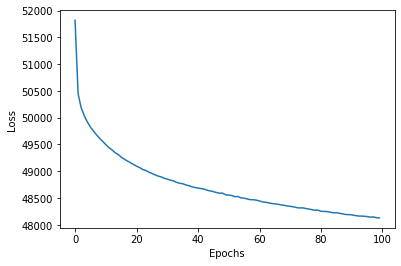

In [ ]:
import matplotlib.pyplot as plt
plt.ion()

fig = plt.figure()
plt.plot(train_loss_avg)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

In [ ]:
"""VAE_Vol_thresh - using a volume threshold to clairfy the mtiochondria structures of COX4
it then uses a Variational autoenconder to determine the unique features"""

In [ ]:
# set to evaluation mode
vae.eval()

test_loss_avg, num_batches = 0, 0
for image_batch, _ in test_loader:
    
    with torch.no_grad():
    
        image_batch = image_batch.to(device)

        # vae reconstruction
        image_batch_recon, latent_mu, latent_logvar = vae(image_batch)

        # reconstruction error
        loss = vae_loss(image_batch_recon, image_batch, latent_mu, latent_logvar)

        test_loss_avg += loss.item()
        num_batches += 1
    
test_loss_avg /= num_batches
print('average reconstruction error: %f' % (test_loss_avg))

average reconstruction error: 49522.820107


Original images


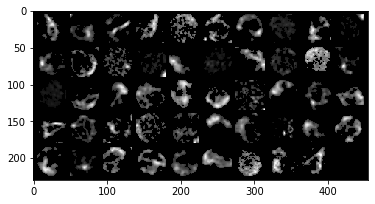

VAE reconstruction:


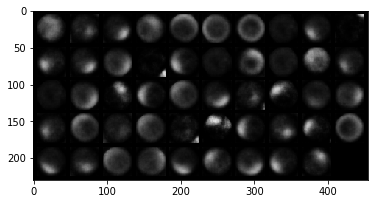

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
plt.ion()

import torchvision.utils

vae.eval()

# This function takes as an input the images to reconstruct
# and the name of the model with which the reconstructions
# are performed
def to_img(x):
    x = x.clamp(0, 1)
    return x

def show_image(img):
    img = to_img(img)
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

def visualise_output(images, model):

    with torch.no_grad():
    
        images = images.to(device)
        images, _, _ = model(images)
        images = images.cpu()
        images = to_img(images)
        np_imagegrid = torchvision.utils.make_grid(images[1:50], 10, 5).numpy()
        plt.imshow(np.transpose(np_imagegrid, (1, 2, 0)))
        plt.show()

images, labels = iter(test_loader).next()

# First visualise the original images
print('Original images')
show_image(torchvision.utils.make_grid(images[1:50],10,5))
plt.show()

# Reconstruct and visualise the images using the vae
print('VAE reconstruction:')
visualise_output(images, vae)

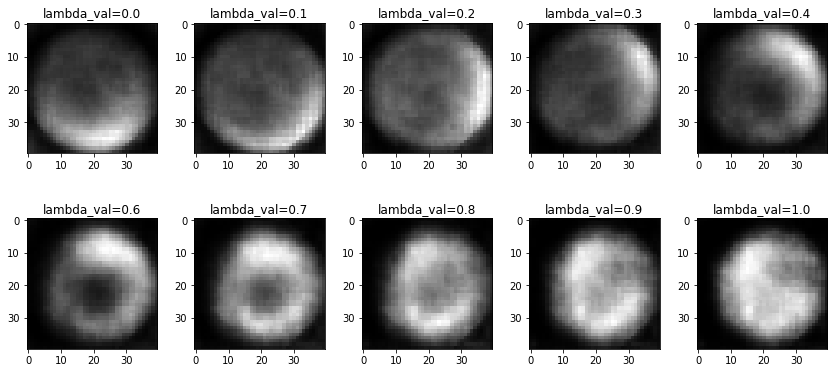

In [ ]:
vae.eval()

def interpolation(lambda1, model, img1, img2):
    
    with torch.no_grad():
    
        # latent vector of first image
        img1 = img1.to(device)
        latent_1, _ = model.encoder(img1)

        # latent vector of second image
        img2 = img2.to(device)
        latent_2, _ = model.encoder(img2)

        # interpolation of the two latent vectors
        inter_latent = lambda1* latent_1 + (1- lambda1) * latent_2

        # reconstruct interpolated image
        inter_image = model.decoder(inter_latent)
        inter_image = inter_image.cpu()

        return inter_image
    
# sort part of test set by digit
digits = [[] for _ in range(10)]
for img_batch, label_batch in test_loader:
    for i in range(img_batch.size(0)):
        digits[label_batch[i]].append(img_batch[i:i+1])
    if sum(len(d) for d in digits) >= 1000:
        break;

# interpolation lambdas
lambda_range=np.linspace(0,1,10)

fig, axs = plt.subplots(2,5, figsize=(15, 6))
fig.subplots_adjust(hspace = .5, wspace=.001)
axs = axs.ravel()

for ind,l in enumerate(lambda_range):
    inter_image=interpolation(float(l), vae, digits[0][7], digits[0][1])
   
    inter_image = to_img(inter_image)
    
    image = inter_image.numpy()
   
    axs[ind].imshow(image[0,0,:,:], cmap='gray')
    axs[ind].set_title('lambda_val='+str(round(l,1)))
plt.show() 

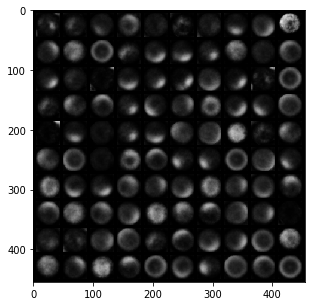

In [ ]:
vae.eval()

with torch.no_grad():

    # sample latent vectors from the normal distribution
    latent = torch.randn(128, latent_dims, device=device)

    # reconstruct images from the latent vectors
    img_recon = vae.decoder(latent)
    img_recon = img_recon.cpu()

    fig, ax = plt.subplots(figsize=(5, 5))
    show_image(torchvision.utils.make_grid(img_recon.data[:100],10,5))
    plt.show()

In [ ]:
 for batch in test_loader:
    img, _ = batch
    img = img.to(device)
    #img = img.view(img.size(0), -1)
    with torch.no_grad(): # will speed it up
        outputs, _, _ = vae(img)
 
        outputs = outputs.cpu()
        outputs = to_img(outputs)
 
  
    

for i in range(0,outputs.shape[0]):
    f, (ax1, ax2) = plt.subplots(1,2, figsize = (10,10))
    ax1.imshow(outputs[i,0,:,:])
    ax2.imshow(img[i].view(40,40))
    
    ax1.set_title('Autoenconder')
    ax2.set_title('Original')
    plt.show()

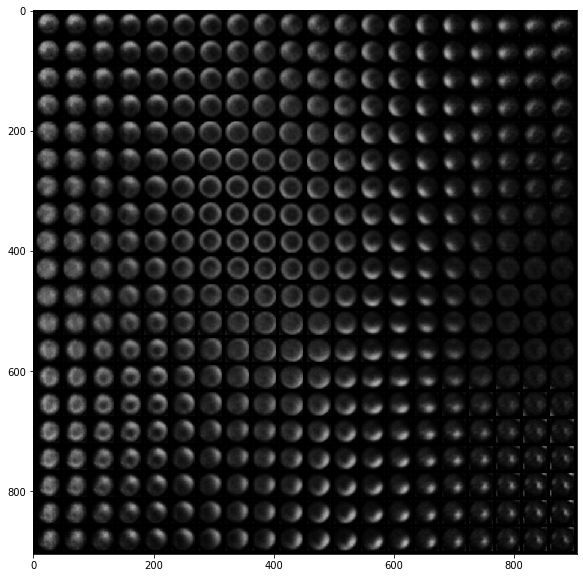

In [ ]:
# load a network that was trained with a 2d latent space
if latent_dims != 2:
    print('Please change the parameters to two latent dimensions.')
    
with torch.no_grad():
    
    # create a sample grid in 2d latent space
    latent_x = np.linspace(-1.5,1.5,20)
    latent_y = np.linspace(-1.5,1.5,20)
    latents = torch.FloatTensor(len(latent_y), len(latent_x), 2)
    for i, lx in enumerate(latent_x):
        for j, ly in enumerate(latent_y):
            latents[j, i, 0] = lx
            latents[j, i, 1] = ly
    latents = latents.view(-1, 2) # flatten grid into a batch

    # reconstruct images from the latent vectors
    latents = latents.to(device)
    image_recon = vae.decoder(latents)
    image_recon = image_recon.cpu()

    fig, ax = plt.subplots(figsize=(10, 10))
    show_image(torchvision.utils.make_grid(image_recon.data[:400],20,5))
    plt.show()

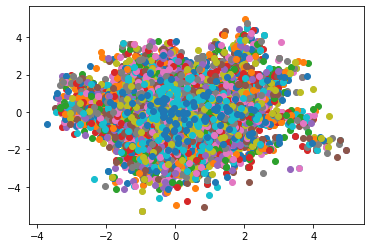

In [ ]:
#https://avandekleut.github.io/vae/
def plot_latent(autoencoder, data, num_batches=100):
    global z 
    z= None
    for img_batch, label_batch in (data):
        with torch.no_grad():
            mulatent, logvar, = autoencoder.encoder(img_batch.to(device)) # mean of latent spae and logvar of the enconder is returned 
        mulatent = mulatent.to('cpu').detach().numpy()
        if z is None:
            z = mulatent
        else:
            z = np.append(z,mulatent, axis= 0)
        plt.scatter(mulatent[:, 0], mulatent[:, 1])
        if i > num_batches:
            plt.colorbar()
            break
            
plot_latent(vae,test_loader)

In [ ]:
index = 0 
dictrain = {}
mulatentdic ={}
mulatentarray = None
for img_batch, label_batch in (test_loader):
    with torch.no_grad():
        mulatent, logvar, = vae.encoder(img_batch.to(device)) # mean of latent spae and logvar of the enconder is returned 
    mulatent = mulatent.to('cpu').detach().numpy()
    index = index+1
    #indexes= np.where(np.max(np.abs(mulatent), axis = 1) <= .4)[0]
    indexes= np.where( (2.9 >= np.max(np.abs(mulatent), axis = 1)) & (np.max(np.abs(mulatent), axis = 1 ) >= 2))[0]
    dictrain[index] =  img_batch[indexes,0,:,:] 
    mulatentdic[index] = mulatent[indexes]
    
    if mulatentarray is None:
        mulatentarray = mulatent[indexes]
    else:
        mulatentarray = np.append(mulatentarray, mulatent[indexes], axis = 0)
    

In [ ]:
np.max(np.abs(mulatent), axis = 1) <= 0.2
np.where(np.max(np.abs(mulatent), axis = 1) <= 0.3)

(array([ 9, 14, 20, 23, 27, 35, 64, 68]),)

In [ ]:
x = np.array(list(mulatentdic.values()) )

In [ ]:
mulatentarray .shape

(34174,)

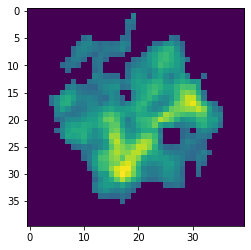

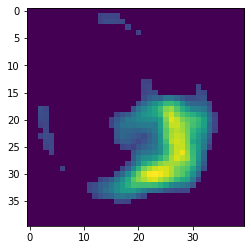

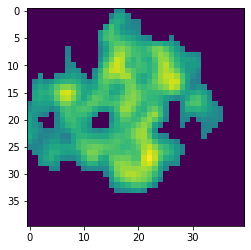

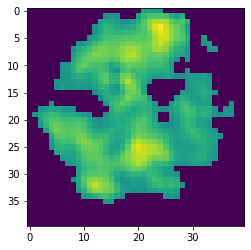

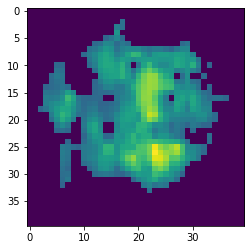

...

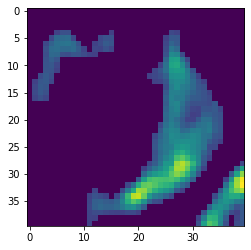

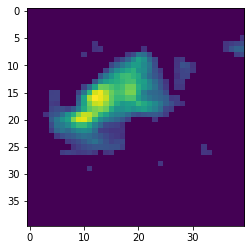

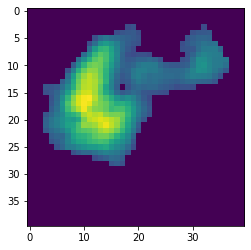

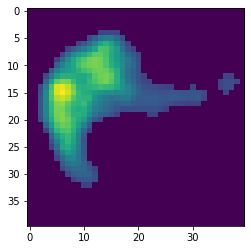

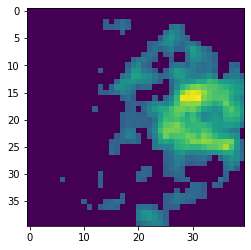

In [ ]:
numb =4
for i in list(range(0,dictrain[numb ].shape[0])):
    plt.imshow(dictrain[numb ][i])
    plt.show()

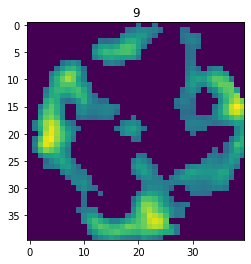

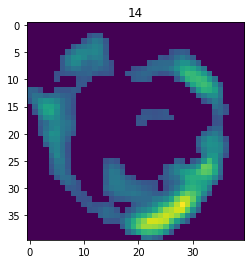

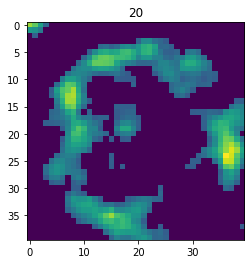

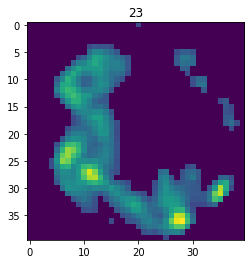

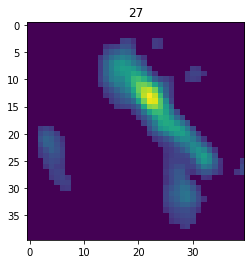

...

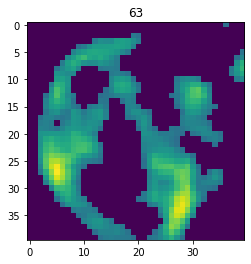

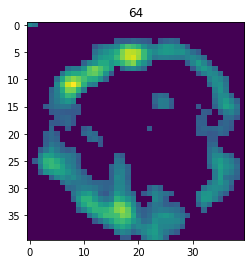

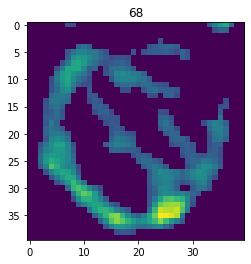

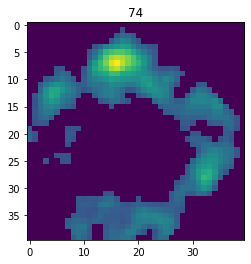

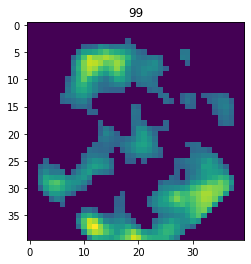

In [ ]:
# <= .4 gets ring structures 

indexes= np.where(np.max(np.abs(mulatent), axis = 1) <= .4)[0]
for index in indexes:
    plt.title(index)
    plt.imshow(img_batch[index,0,:,:])
    plt.show()

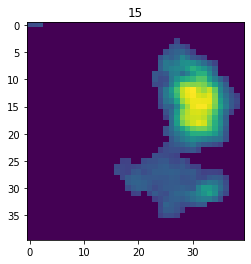

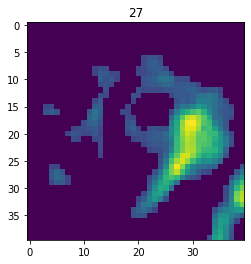

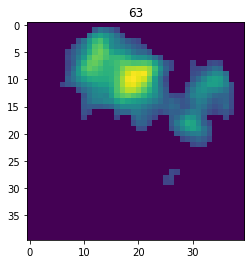

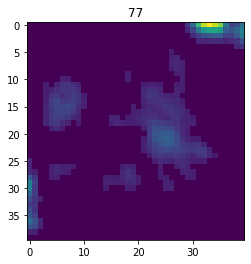

In [ ]:
indexes= np.where( (4  >= np.max(np.abs(mulatent), axis = 1)) & (np.max(np.abs(mulatent), axis = 1 ) >= 3))[0]
for index in indexes:
    plt.title(index)
    plt.imshow(img_batch[index,0,:,:])
    plt.show()

In [ ]:
x = mulatentarray

In [ ]:
y = mulatentarray

In [ ]:
p = mulatentarray

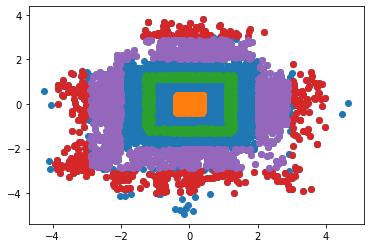

In [ ]:
plt.scatter(z[:,0], z[:,1])
plt.scatter(x[:,0],x[:,1] )
plt.scatter(y[:,0],y[:,1] )
plt.scatter(p[:,0],p[:,1] )
plt.scatter(mulatentarray[:,0],mulatentarray[:,1] )

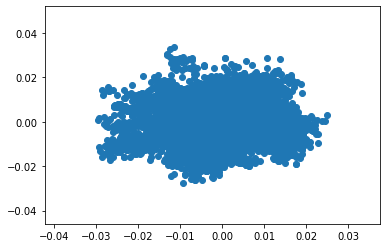

In [ ]:
u, s, vh = np.linalg.svd(z, full_matrices=False)
plt.scatter(u[:,0], u[:,1])

[0.53230983 0.46769017]
[154.94269 145.23389]


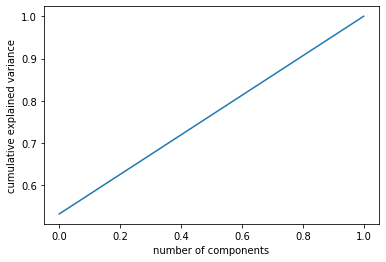

In [ ]:
import numpy as np
from sklearn.decomposition import PCA
# choosing number of components to use 
#https://jakevdp.github.io/PythonDataScienceHandbook/05.09-principal-component-analysis.html
pca = PCA()
pca.fit(z)
 
print(pca.explained_variance_ratio_)

print(pca.singular_values_)

plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');






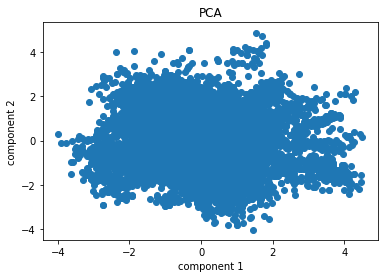

In [ ]:
pca = PCA(2)  # indicating number of components based on above
projected = pca.fit_transform(z)
projected.shape

plt.xlabel('component 1')
plt.ylabel('component 2')
plt.title('PCA')
plt.scatter(projected[:,0], projected[:,1])

### convulution of pic to test autoenconder 
goal is to determine which pixel features are responsible for the autoenconder output.
This will be determined by doing a 5X5 convulution through each part of the picture and turning it to 0 
for gradcam

In [ ]:
test.shape

(1, 1, 40, 40)

[-200, 0]


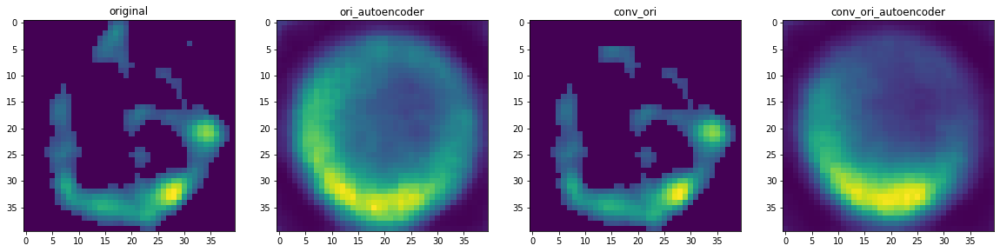

[0, 200]


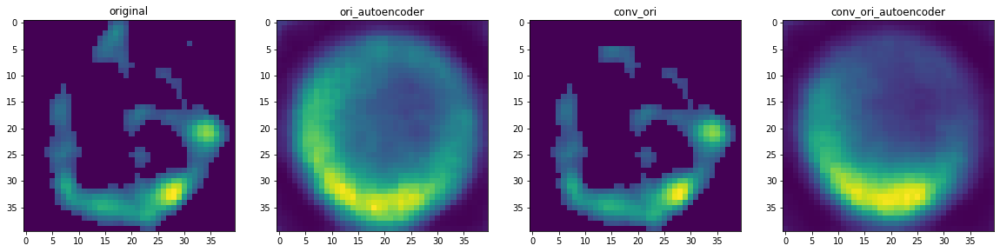

[200, 400]


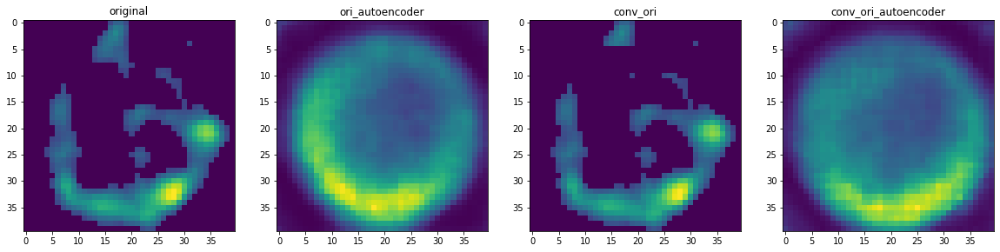

[400, 600]


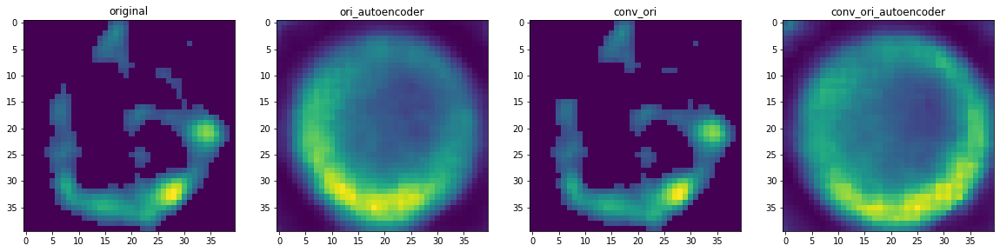

[600, 800]


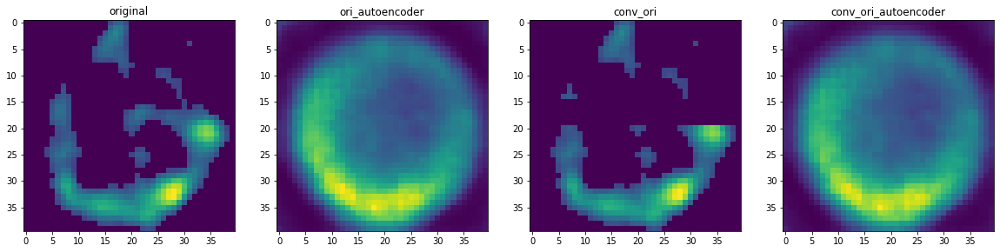

[800, 1000]


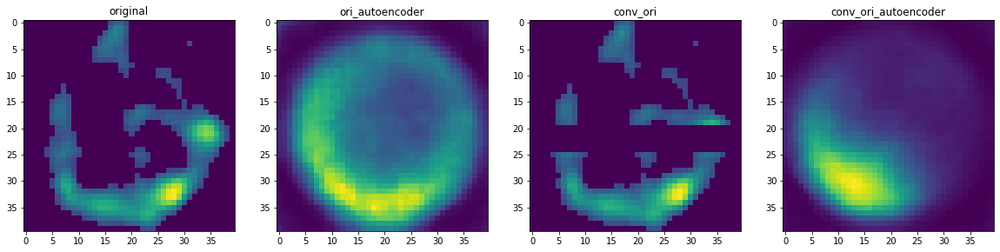

[1000, 1200]


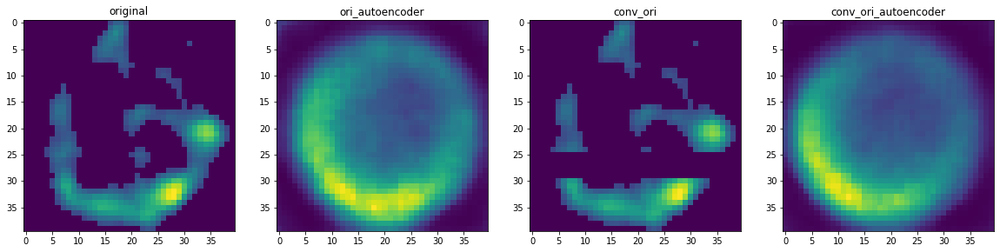

[1200, 1400]


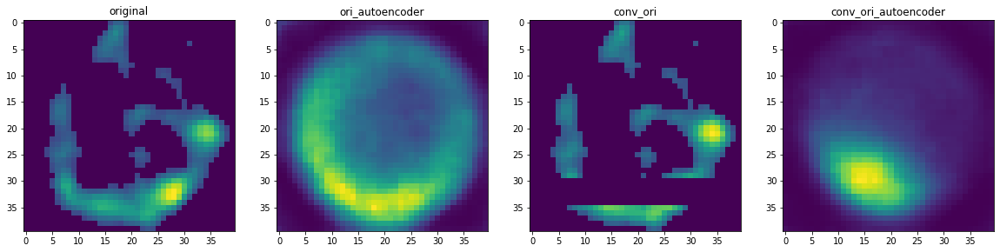

[1200, 1400]


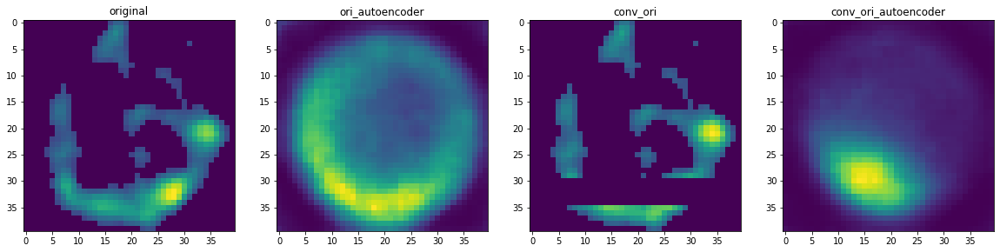

In [ ]:
l = []
convsize = 200
sample = 2 # which of the batch samples to use 
test = img[sample].view(40,40).detach().numpy().copy()
for num in range(0, len(test.ravel()), convsize):
    test = img[sample].view(1,1,40,40).detach().numpy().copy() # detaching a 87, 1600 batch matrix that has 87 samples at 40
    test1 = img[sample].view(1,1,40,40).detach().numpy().copy()
    
    test1 = test1.ravel()
    if num == 0:
        test1[0:convsize] = 0
    else:
        test1[num-convsize:num] = 0
    
   
    with torch.no_grad(): # will speed it up
        origimg = torch.tensor(test.reshape(1,1,40,40)) # turning the numpy array into a tensor 
        ruinimg = torch.tensor(test1.reshape(1,1,40,40))
        
        outputori, _, _  = vae(origimg ) 
        outputruin, _, _  = vae(ruinimg)
    # calculating the loss function and saving it 
    lossori_vsruin = ((outputruin - outputori)**2).mean().detach().numpy().item(0)
    lossimg_vs_ori = ((outputori - origimg)**2).mean().detach().numpy().item(0)
    lossimg_vsruin = ((outputruin - origimg)**2).mean().detach().numpy().item(0)
    coord = [num-convsize,num]
    l.append([coord, lossori_vsruin,lossimg_vs_ori,lossimg_vsruin])
    if( lossimg_vs_ori != lossimg_vsruin):
        print([num-convsize,num])
        f, (ax1, ax2, ax3,ax4) = plt.subplots(1,4, figsize = (20,20))
        ax1.imshow(test.reshape(40,40))
        ax2.imshow(outputori.view(40,40))
        ax3.imshow(test1.reshape(40,40))
        ax4.imshow(outputruin.view(40,40))

        ax1.set_title('original')
        ax2.set_title('ori_autoencoder')
        ax3.set_title('conv_ori')
        ax4.set_title('conv_ori_autoencoder')

        plt.show()
print([num-convsize,num])       
f, (ax1, ax2, ax3,ax4) = plt.subplots(1,4, figsize = (20,20))
ax1.imshow(test.reshape(40,40))
ax2.imshow(outputori.view(40,40))
ax3.imshow(test1.reshape(40,40))
ax4.imshow(outputruin.view(40,40))

ax1.set_title('original')
ax2.set_title('ori_autoencoder')
ax3.set_title('conv_ori')
ax4.set_title('conv_ori_autoencoder')

lossconvdf = pd.DataFrame(l)
    

# MMD-VAE
https://ermongroup.github.io/blog/a-tutorial-on-mmd-variational-autoencoders/


https://github.com/napsternxg/pytorch-practice/blob/master/Pytorch%20-%20MMD%20VAE.ipynb
 

In [ ]:
class Flatten(torch.nn.Module):
    def forward(self, x):
        return x.view(x.size(0), -1)
    
class Reshape(torch.nn.Module):
    def __init__(self, outer_shape):
        super(Reshape, self).__init__()
        self.outer_shape = outer_shape
    def forward(self, x):
        return x.view(x.size(0), *self.outer_shape)

In [ ]:
from torch.autograd import Variable
def get_flatten_output():
    model = torch.nn.Sequential(
        torch.nn.Conv2d(1, 64, 4, 2),
        torch.nn.LeakyReLU(),
        torch.nn.Conv2d(64, 128, 4, 2),
        torch.nn.LeakyReLU(),
        Flatten(),
    )
    return model(Variable(torch.rand(2,1,40,40))).size()
get_flatten_output()

torch.Size([2, 8192])

In [ ]:
def get_reshape_output():
    model = torch.nn.Sequential(
        torch.nn.Linear(2, 1024),
        torch.nn.ReLU(),
        torch.nn.Linear(1024, 10*10*128),
        torch.nn.ReLU(),
        Reshape((128,10,10,)),
        torch.nn.ConvTranspose2d(128, 64, 4, 2),
        torch.nn.ReLU(),
        torch.nn.ConvTranspose2d(64, 1, 4, 2, padding=3),
        torch.nn.Sigmoid()
    )
    return model(Variable(torch.rand(2,2))).size()
get_reshape_output()

torch.Size([2, 1, 40, 40])

In [ ]:
# Encoder and decoder use the DC-GAN architecture
# (I+2*P-F)/S+1

class Encoder(torch.nn.Module):
    def __init__(self, z_dim):
        super(Encoder, self).__init__()
        self.model = torch.nn.ModuleList([
            torch.nn.Conv2d(1, out_channels = 64, kernel_size = 4, stride =2, padding=1), # out: c x 20 x 20
            torch.nn.LeakyReLU(),
            torch.nn.Conv2d(64,  out_channels = 128, kernel_size =4,  stride =2, padding=1), # out: 10X10 
            torch.nn.LeakyReLU(),
            Flatten(),
            torch.nn.Linear(10*10*128, 1024), #10*10*128 based on outchannel multiplied by dimension of the image 10X10
            torch.nn.LeakyReLU(),
            torch.nn.Linear(1024, z_dim)
        ])
        
    def forward(self, x):
        #print("Encoder")
        #print(x.size())
        for layer in self.model:
            x = layer(x)
            #print(x.size())
        return x
    
    
class Decoder(torch.nn.Module):
    def __init__(self, z_dim):
        super(Decoder, self).__init__()
        self.model = torch.nn.ModuleList([
            torch.nn.Linear(z_dim, 1024),
            torch.nn.ReLU(),
            torch.nn.Linear(1024, 10*10*128),
            torch.nn.ReLU(),
            Reshape((128,10,10,)),
            torch.nn.ConvTranspose2d(128, 64, 4, 2, padding=1),
            torch.nn.ReLU(),
            torch.nn.ConvTranspose2d(64, 1, 4, 2, padding=1),
            torch.nn.Sigmoid()
        ])
        
    def forward(self, x):
        #print("Decoder")
        #print(x.size())
        for layer in self.model:
            x = layer(x)
            #print(x.size())
        return x

In [ ]:
def compute_kernel(x, y):
    x_size = x.size(0)
    y_size = y.size(0)
    dim = x.size(1)
    x = x.unsqueeze(1) # (x_size, 1, dim)
    y = y.unsqueeze(0) # (1, y_size, dim)
    tiled_x = x.expand(x_size, y_size, dim)
    tiled_y = y.expand(x_size, y_size, dim)
    kernel_input = (tiled_x - tiled_y).pow(2).mean(2)/float(dim)
    return torch.exp(-kernel_input) # (x_size, y_size)

def compute_mmd(x, y):
    x_kernel = compute_kernel(x, x)
    y_kernel = compute_kernel(y, y)
    xy_kernel = compute_kernel(x, y)
    mmd = x_kernel.mean() + y_kernel.mean() - 2*xy_kernel.mean()
    return mmd

In [ ]:
class Model(torch.nn.Module):
    def __init__(self, z_dim):
        super(Model, self).__init__()
        self.encoder = Encoder(z_dim)
        self.decoder = Decoder(z_dim)
        
    def forward(self, x):
        z = self.encoder(x)
        x_reconstructed = self.decoder(z)
        return z, x_reconstructed

In [ ]:
model = Model(2)

In [ ]:
z, x_reconstructed = model(Variable(torch.rand(1,1,40,40)))
z.size(), x_reconstructed.size()

(torch.Size([1, 2]), torch.Size([1, 1, 40, 40]))

In [ ]:
# Convert a numpy array of shape [batch_size, height, width, 1] into a displayable array 
# of shape [height*sqrt(batch_size, width*sqrt(batch_size))] by tiling the images
def convert_to_display(samples):
    cnt, height, width = int(math.floor(math.sqrt(samples.shape[0]))), samples.shape[1], samples.shape[2]
    samples = np.transpose(samples, axes=[1, 0, 2, 3])
    samples = np.reshape(samples, [height, cnt, cnt, width])
    samples = np.transpose(samples, axes=[1, 0, 2, 3])
    samples = np.reshape(samples, [height*cnt, width*cnt])
    return samples

lossdf = []

def train(
    dataloader,
    z_dim=7, # increased the Z dim originally 2
    n_epochs=10,
    use_cuda=True,
    print_every=100,
    plot_every=500
):
     
    model = Model(z_dim)
    if use_cuda:
        model = model.cuda()
    #print(model)
    optimizer = torch.optim.Adam(model.parameters())
    i = -1
    for epoch in range(n_epochs):
        for images, labels in dataloader:
            i += 1
            optimizer.zero_grad()
            x = Variable(images, requires_grad=False)
            true_samples = Variable(
                torch.randn(200, z_dim),
                requires_grad=False
            )
            if use_cuda:
                x = x.cuda()
                true_samples = true_samples.cuda()
            z, x_reconstructed = model(x)
            mmd = compute_mmd(true_samples, z)
            nll = (x_reconstructed - x).pow(2).mean()
            loss = nll + mmd
            lossdf.append({'epoch':epoch, 'negativeLog': float(nll.detach().cpu().numpy()),'mean_prior_vs_posterior':float(mmd.detach().cpu().numpy()), 'loss':float(loss.detach().cpu().numpy())})
            loss.backward()
            optimizer.step()
            #if i % print_every == 0:
             #   print("Negative log likelihood is {:.5f}, mmd loss is {:.5f}".format(
              #      nll.data[0], mmd.data[0]))
            if i % plot_every == 0:
                gen_z = Variable(
                    torch.randn(100, z_dim),
                    requires_grad=False
                )
                if use_cuda:
                    gen_z = gen_z.cuda()
                samples = model.decoder(gen_z)
                samples = samples.permute(0,2,3,1).contiguous().cpu().data.numpy()
        plt.imshow(convert_to_display(samples), cmap='Greys_r')
        plt.show()
                
    return model

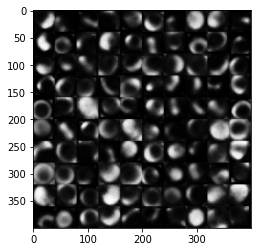

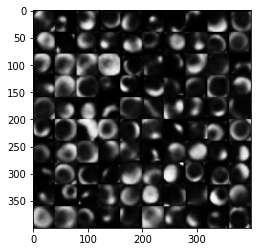

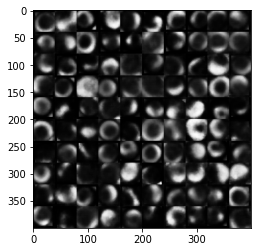

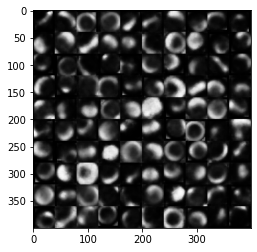

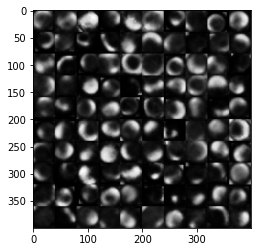

...

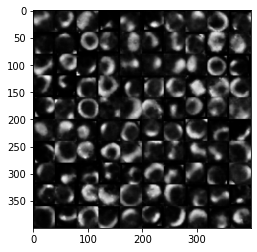

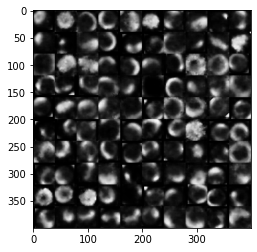

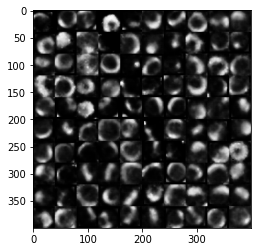

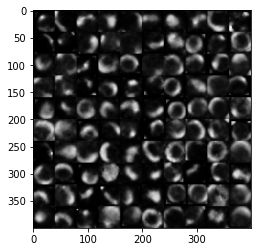

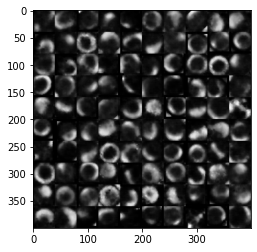

In [ ]:
z_dim = 7 # changed to 30 Z 
model = train(train_loader, z_dim=z_dim, n_epochs=100)

## Saving the model 
name = '63MMD_VAE_volThresh_vacuole'#'63MMD_VAE_volThresh'#'MMD_VAE_Binary'  # 'MMD_VAE_volThresh' - using volthresh and mmd vae  #MMD_VAE_preBinary_volthresh
torch.save(model.state_dict(), path+'/{}.pth'.format(name)) 

# saving the loss data
lossdf = pd.DataFrame(lossdf)
lossdf.to_csv(os.getcwd()+'/'+'lossdf_{}.csv'.format(name), sep = '\t' , index = True) 

In [ ]:
latent_dims = 7
use_gpu = True
device = torch.device("cuda:0" if use_gpu and torch.cuda.is_available() else "cpu")

In [ ]:

# loading back the model! 
z_dim = 7 # changed to 30 Z 
name ='63MMD_VAE_volThresh_vacuole'#'MMD_VAE_preBinary_volthresh' #'63MMD_VAE_volThresh' #'MMD_VAE_preBinary_volthresh' #MMD_VAE_Binary MMD_VAE_preBinary_volthresh
model = Model(z_dim)
model.load_state_dict(torch.load(path+'/{}.pth'.format(name), map_location={'cuda:0': 'cpu'})) # to load model with cpu
model.to(device) # will turn model for GPU or CPU depending on the device stated above
model.eval()

#loading in lossdf
 

lossdf=pd.read_csv(os.getcwd()+'/'+'lossdf_{}.csv'.format(name), sep = '\t', index_col=0)

Text(0.5, 0, 'Epoch')

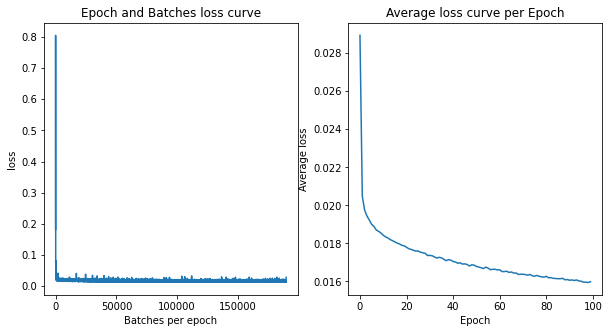

In [ ]:
f, (ax1, ax2) = plt.subplots(1,2, figsize = (10,5))

subj = 'loss'
lossdfmean = lossdf.groupby('epoch').mean()
ax1.plot(lossdf.index, lossdf[subj])
ax2.plot(lossdfmean .index, lossdfmean[subj])

ax1.set_title('Epoch and Batches {} curve'.format(subj))
ax1.set_ylabel('{}'.format(subj))
ax1.set_xlabel('Batches per epoch')

ax2.set_title('Average {} curve per Epoch'.format(subj))
ax2.set_ylabel('Average {}'.format(subj))
ax2.set_xlabel('Epoch')

### Observing the Latent Space
from the variational autoenconders I am observing whether new phenotypes can be identified

In [ ]:
def to_img(x):
    x = x.clamp(0, 1)
    return x

def show_image(img):
    img = to_img(img)
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

def visualise_output(images, model):

    with torch.no_grad():
    
        images = images.to(device)
        images, _, _ = model(images)
        images = images.cpu()
        images = to_img(images)
        np_imagegrid = torchvision.utils.make_grid(images[1:50], 10, 5).numpy()
        plt.imshow(np.transpose(np_imagegrid, (1, 2, 0)))
        plt.show()


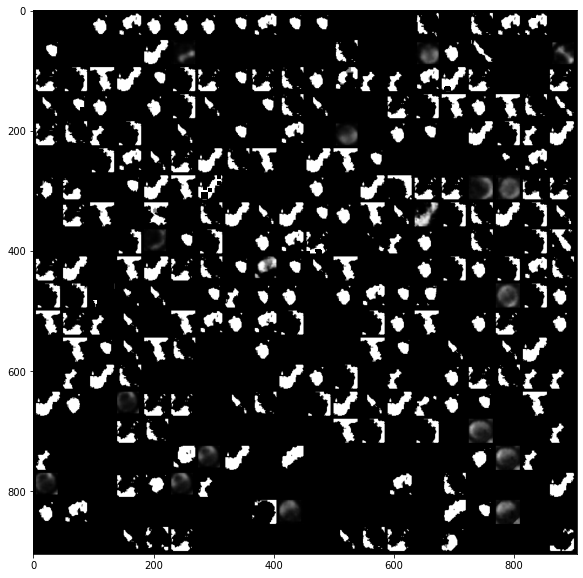

In [ ]:
# load a network that was trained with a 2d latent space
 
z_dim = 7
if latent_dims != z_dim:
    print('Please change the parameters to two latent dimensions.')
    
with torch.no_grad():
    
    # create a sample grid in 2d latent space
    latent_x = np.linspace(-1.5,1.5,20)
    latent_y = np.linspace(-1.5,1.5,20)
    latents = torch.FloatTensor(len(latent_y), len(latent_x), z_dim)
    for i, lx in enumerate(latent_x):
        for j, ly in enumerate(latent_y):
            latents[j, i, 0] = lx
            latents[j, i, 1] = ly
    latents = latents.view(-1, z_dim) # flatten grid into a batch

    # reconstruct images from the latent vectors
    latents = latents.to(device)
    image_recon = model.decoder(latents)
    image_recon = image_recon.cpu()

    fig, ax = plt.subplots(figsize=(10, 10))
    show_image(torchvision.utils.make_grid(image_recon.data[:400],20,5))
    plt.show()

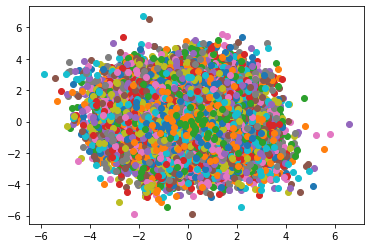

In [ ]:
#D
'simply seeing if images are found in different clusters'
def plot_latent(autoencoder, data, num_batches=685):
    global z 
    z= None
    for img_batch, label_batch in (data):
        with torch.no_grad():
            mulatent = autoencoder.encoder(img_batch.to(device)) # mean of latent spae and logvar of the enconder is returned 
        mulatent = mulatent.to('cpu').detach().numpy()
        if z is None:
            z = mulatent
        else:
            z = np.append(z,mulatent, axis= 0)
        plt.scatter(mulatent[:, 0], mulatent[:, 1])
        if i > num_batches:
            plt.colorbar()
            break
            
plot_latent(model,test_loader)

[0.1565837  0.15209512 0.14535606 0.14284726 0.13918541 0.1346443
 0.12928816]
[439.55176 433.20593 423.4999  419.82925 414.41324 407.59677 399.4074 ]


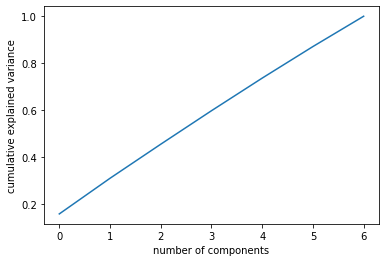

In [ ]:
import numpy as np
from sklearn.decomposition import PCA
# choosing number of components to use 
#https://jakevdp.github.io/PythonDataScienceHandbook/05.09-principal-component-analysis.html
pca = PCA()
pca.fit(z)
 
print(pca.explained_variance_ratio_)

print(pca.singular_values_)

plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');



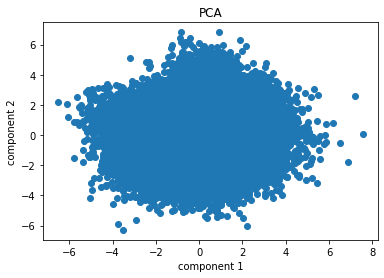

In [ ]:
pca = PCA(5)  # indicating number of components based on above
projected = pca.fit_transform(z)
projected.shape

plt.xlabel('component 1')
plt.ylabel('component 2')
plt.title('PCA')
plt.scatter(projected[:,0], projected[:,1])

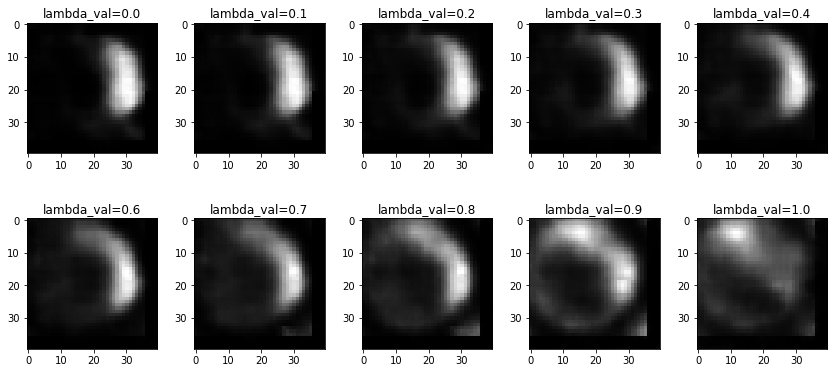

In [ ]:


def interpolation(lambda1, model, img1, img2):
    
    with torch.no_grad():
    
        # latent vector of first image
        img1 = img1.to(device)
        latent_1= model.encoder(img1)

        # latent vector of second image
        img2 = img2.to(device)
        latent_2 = model.encoder(img2)

        # interpolation of the two latent vectors
        inter_latent = lambda1* latent_1 + (1- lambda1) * latent_2

        # reconstruct interpolated image
        inter_image = model.decoder(inter_latent)
        inter_image = inter_image.cpu()

        return inter_image
    
# sort part of test set by digit
digits = [[] for _ in range(10)]
for img_batch, label_batch in test_loader:
    for i in range(img_batch.size(0)):
        digits[label_batch[i]].append(img_batch[i:i+1])
    if sum(len(d) for d in digits) >= 1000:
        break;

# interpolation lambdas
lambda_range=np.linspace(0,1,10)

fig, axs = plt.subplots(2,5, figsize=(15, 6))
fig.subplots_adjust(hspace = .5, wspace=.001)
axs = axs.ravel()

for ind,l in enumerate(lambda_range):
    inter_image=interpolation(float(l), model, digits[0][7], digits[0][1])
   
    inter_image = to_img(inter_image)
    
    image = inter_image.numpy()
   
    axs[ind].imshow(image[0,0,:,:], cmap='gray')
    axs[ind].set_title('lambda_val='+str(round(l,1)))
plt.show() 

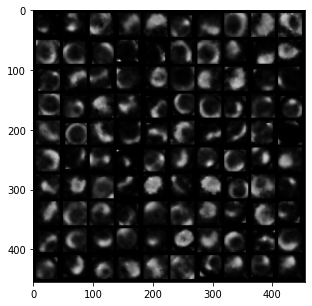

In [ ]:
 
with torch.no_grad():

    # sample latent vectors from the normal distribution
    latent = torch.randn(128, latent_dims, device=device)

    # reconstruct images from the latent vectors
    img_recon = model.decoder(latent)
    img_recon = img_recon.cpu()

    fig, ax = plt.subplots(figsize=(5, 5))
    show_image(torchvision.utils.make_grid(img_recon.data[:100],10,5))
    plt.show()

In [ ]:
index = 0 
dictrain = {}
mulatentdic ={}
mulatentarray = None
for img_batch, label_batch in (test_loader):
    with torch.no_grad():
        mulatent = model.encoder(img_batch.to(device)) # mean of latent spae and logvar of the enconder is returned 
    mulatent = mulatent.to('cpu').detach().numpy()
    index = index+1
    #indexes= np.where(np.max(np.abs(mulatent), axis = 1) <= .2)[0]
    #indexes= np.where(np.max((mulatent), axis = 1) <= -.1)[0] # negatives
    
    #indexes= np.where( (1.5>= np.max(np.abs(mulatent), axis = 1)) & (np.max(np.abs(mulatent), axis = 1 ) >= 1.1))[0]
    #indexes= np.where( (2.3>= np.max(np.abs(mulatent), axis = 1)) & (np.max(np.abs(mulatent), axis = 1 ) >= 2.2))[0]
    indexes= np.where( (6>= np.max(np.abs(mulatent), axis = 1)) & (np.max(np.abs(mulatent), axis = 1 ) >= 4))[0]
    dictrain[index] =  img_batch[indexes,0,:,:] 
    mulatentdic[index] = mulatent[indexes]
    
    if mulatentarray is None:
        mulatentarray = mulatent[indexes]
    else:
        mulatentarray = np.append(mulatentarray, mulatent[indexes], axis = 0)

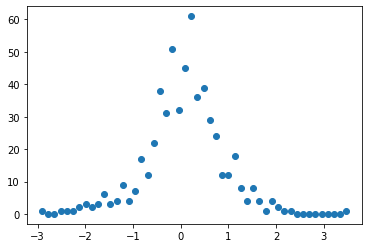

In [ ]:
hist, bins = np.histogram(mulatent.ravel(),50)
plt.scatter(bins[1:], hist)

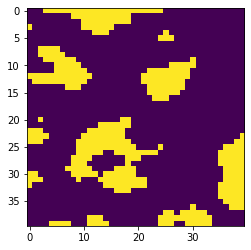

In [ ]:
numb =2
for i in list(range(0,dictrain[numb ].shape[0])):
    plt.imshow(dictrain[numb ][i])
    plt.show()

In [ ]:
val_set_nt, d = loaddata(testdf,path1, threshold = False ) # will load in the orginal data with no thresholding
del d 


In [ ]:
# loading in ALL YOUR dataset from the DataFrame
 
val_set, mask_stack2 = loaddata(filedf,path1 ) # loading in all the images
 
#test_dataset =imageDataGenerator(val_set, mask_stack2)

val_set_nt, d = loaddata(filedf,path1, threshold = False ) # will load in the orginal data 

del d 

In [ ]:
5376,13020,12388

In [ ]:
"cerating DataFrame to house all the indexes "
indexlist = []
df = filedf # filedf change this if you want to change which st you want 
for index in range(val_set_nt.shape[0]):
    with torch.no_grad():
      img = torch.tensor(val_set[index].astype(np.float32) ).to(device).reshape(1,1,40,40) 
      mulatent = model.encoder(img) # mean of latent spae and logvar of the enconder is returned 
    mulatent = mulatent.to('cpu').detach().numpy()
 
 
    cellname = df.iloc[index ]['file'].split('-')[0]
    indexlist.append({'cellname':cellname, 'indexes': index, 'max_abs':np.max(np.abs(mulatent)), 'values':mulatent[0] })
 
allindexdf = pd.DataFrame(indexlist)

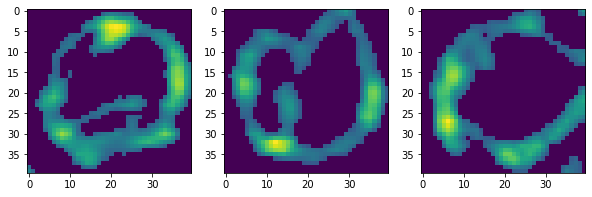

In [ ]:
'images that are circular, using these represenative images to identify their latent space and seeing what other images are found there'
f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (10,10))
ax1.imshow(val_set[1034])
ax2.imshow(val_set[5036])
ax3.imshow(val_set[625])

In [ ]:
"loading in train set data that does NOT have image augmentation to increase the amount of images, this will be the raw one so we can compare with the original file"
from scipy import stats
indexlist = []
for index in range(val_set_nt.shape[0]):
    with torch.no_grad():
      img = torch.tensor(val_set[index].astype(np.float32) ).to(device).reshape(1,1,40,40) 
      mulatent = model.encoder(img) # mean of latent spae and logvar of the enconder is returned 
    mulatent = mulatent.to('cpu').detach().numpy()
    #indexes= np.where(np.max(np.abs(mulatent), axis = 1) <= .4)[0]
    #indexes= np.where(np.max((mulatent), axis = 1) <= .1)[0] # negatives

    ### Pearson correlation 
    m, b, r, p, sd = linregress(allindexdf.set_index('indexes').loc[1034,'values'],mulatent[0]) #5376,13020,12388  1034 5036 625
    m, b, r2, p, sd = linregress(allindexdf.set_index('indexes').loc[625,'values'],mulatent[0])
    m, b, r3, p, sd = linregress(allindexdf.set_index('indexes').loc[5036,'values'],mulatent[0])

    ### Kendaull correlation       
    #r,p = stats.kendalltau(allindexdf.set_index('indexes').loc[1028,'values'],mulatent[0])
    #r2,p = stats.kendalltau(allindexdf.set_index('indexes').loc[217,'values'],mulatent[0])
    #r3,p = stats.kendalltau(allindexdf.set_index('indexes').loc[139,'values'],mulatent[0])

    ### spearman correlation 
    #r,p = stats.spearmanr(allindexdf.set_index('indexes').loc[5376,'values'],mulatent[0])
    #r2,p = stats.spearmanr(allindexdf.set_index('indexes').loc[13020,'values'],mulatent[0])
    #r3,p = stats.spearmanr(allindexdf.set_index('indexes').loc[12388,'values'],mulatent[0])

 
    if ((r)< -.5) and ((r2)< -.5)  and ((r3)< -.5): # abs gets the opposite of the circles 
      cellname = df.iloc[index ]['file'].split('-')[0]
      indexlist.append({'cellname':cellname, 'indexes': index, 'corr': [round(r,3), round(r2,3),round(r3,3)], 'max_abs':np.max(np.abs(mulatent)), 'values':mulatent[0] })
 
indexdf = pd.DataFrame(indexlist)
# 23,197,245 

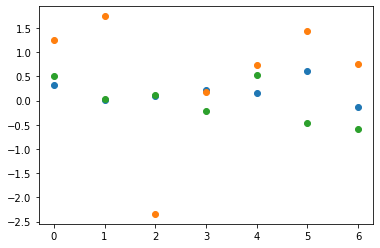

In [ ]:
'observing latent spaces of represenative space' 
plt.scatter(allindexdf.set_index('indexes')[:7].index,allindexdf.set_index('indexes').loc[1034,'values'])
plt.scatter(allindexdf.set_index('indexes')[:7].index,allindexdf.set_index('indexes').loc[625,'values'])
plt.scatter(allindexdf.set_index('indexes')[:7].index,allindexdf.set_index('indexes').loc[5036,'values'])

# Using different clustering and correlation methods
goal is to see if distinct clusters can be found. Overall I found simple linear regression and k means to be the most effective 

In [ ]:
for index in set(indexdf ['indexes'])  :
  f, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize = (10,10))
  with torch.no_grad():
    img = torch.tensor(val_set[index].astype(np.float32) ).to(device).reshape(1,1,40,40) 
    _, outputori = model(img )
  outputoriimg = outputori.to('cpu').detach().numpy().reshape(40,40)
  cellname = df.iloc[index ]['file'].split('-')[0]
  name = cellname +'time_{}'.format(df.iloc[index ]['time'])


  
  # stupid piece of code to get the last number 
  times = []
  for i in ((rlsdf.loc[  cellname  ,  'time_budding' ] )).split(' '):
    try:
      times.append(int(i))
    except:
      pass

  maxval = (indexdf.loc[indexdf['indexes'] == index, 'corr'].values[0])
  #ax1.imshow(val_set_nt[index])
  # getting last bud
  pos = int(cellname.split('_')[1])
  cell = int(cellname.split('_')[3])
  if times[-1] <= 200 : # becasue we removed some buds
    lastbud = df.groupby(['cell', 'pos', 'time']).get_group((cell, pos,times[-1]))['file'].values[0]
  else:
    lastbud = df.groupby(['cell', 'pos', 'time']).get_group((cell, pos,times[-2]))['file'].values[0]

  #graphing 
  ax1.imshow(skimage.io.imread(path1+'/'+lastbud))
  ax2.imshow(skimage.io.imread(path1+'/'+df.iloc[index]['file']))
  ax3.imshow(val_set[index])
  ax4.imshow(outputoriimg )

  ax1.set_title( 'lastbud {}'.format(times[-1]))
  ax2.set_title('{}'.format(name))
  ax3.set_title('Edited_index {}'.format(index)) #217,622,1080, 1977, 1028,1243,1852 not 3,17,1932
  ax4.set_title('VAECor {}'.format( (maxval)))
  plt.tight_layout()
  plt.show()
  plt.close()  #

In [ ]:
### Clustering based on Correlation making a Dendrogram 

In [ ]:
def dendroheatmap(threshold, g, df):
    """ this is used to make the dendrograms on the heiarcheral matrix. To use first i make the sns.clustermap 
    afterwhich you can then use this function 
    threshold -is used for the dendrogram being made, 
    g -is the sns.clusterheatmap made 
    df -is the correlation matrix """
    global cluster
    global clusters 
    

    no_spine = {'left': True, 'bottom': True, 'right': True, 'top': True}
    den = scipy.cluster.hierarchy.dendrogram(g.dendrogram_row.linkage, # give s adictonary color_list, dcord (ycordinte), icord(x coridate of leg)
                                             labels = df.index,
                                             color_threshold= threshold) 
    plt.xticks(rotation=90)
    sns.despine(**no_spine);

    # making clusters dictionary ! 
    from collections import defaultdict

    def get_cluster_classes(den, label='ivl'):
        cluster_idxs = defaultdict(list)
        for c, pi in zip(den['color_list'], den['icoord']):
            for leg in pi[1:3]:
                i = (leg - 5.0) / 10.0
                if abs(i - int(i)) < 1e-5:
                    cluster_idxs[c].append(int(i))

        cluster_classes = {}
        for c, l in cluster_idxs.items():
            i_l = [den[label][i] for i in l]
            cluster_classes[c] = i_l

        return cluster_classes

    clusters = get_cluster_classes(den)

    cluster = []
    for i in df.index:
        included=False
        for j in clusters.keys():
            if i in clusters[j]:
                cluster.append(j)
                included=True
        if not included:
            cluster.append(None)

import seaborn as sns
latentdf = allindexdf['values'].apply(pd.Series) # indexes should still match with allindexdf
df = latentdf.T.corr(method =  'pearson' )
plt.figure(figsize = (20,20))
g = sns.clustermap(df )

 

dendroheatmap(15 , g, latentdf)

In [ ]:
##  Observe which position it is in 
posstrain =1755
if posstrain in latentdf.index.to_list():
    for key in clusters.keys():
        if posstrain in clusters[key]: 
            print('value is in this color', key)

    # length of gene list in keys
    for key in clusters.keys():
        print(key, len(clusters[key]))
else:
    print('no')

value is in this color g
g 497
r 511
c 444
m 527
y 500
k 572
b 7


In [ ]:
for index in clusters['g']:
  f, (ax1, ax2) = plt.subplots(1,2, figsize = (10,10))
  ax1.imshow(val_set_nt[index])
  ax2.imshow(val_set[index])
  plt.show()
  plt.close()
 

## K Mean clustering
here I am using k mean clustering to see if I do a bit of supervised clustering using the 7 latent spaces can we identify phenotypes. I find that the structure phenotype is seen along with the 
intensity phenotype. 

In [ ]:
latentdf = allindexdf['values'].apply(pd.Series) # indexes should still match with allindexdf
df = latentdf.T.corr(method =  'pearson' )

In [ ]:
from sklearn.cluster import KMeans
kmeans = KMeans(16, random_state=0) #34
kmeans.fit(latentdf)

identified_clusters = kmeans.fit_predict(latentdf)
identified_clusters

array([15, 15, 13, ..., 12,  5,  0], dtype=int32)

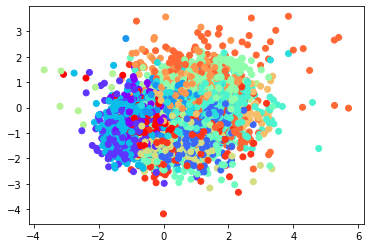

In [ ]:
data_with_clusters = latentdf.copy()
data_with_clusters['Clusters'] = identified_clusters 
plt.scatter(data_with_clusters[0],data_with_clusters[5],c=data_with_clusters['Clusters'],cmap='rainbow')

In [ ]:
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.datasets import make_blobs


bandwidth = estimate_bandwidth(latentdf, quantile=0.2, n_samples=500)

ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(latentdf)
 

identified_clusters = ms.fit_predict(latentdf)
identified_clusters

data_with_clusters = latentdf.copy()
data_with_clusters['Clusters'] = identified_clusters 

print(len(data_with_clusters['Clusters'].unique()))
data_with_clusters['Clusters'].unique()

10


array([0, 1, 2, 8, 3, 6, 7, 4, 9, 5])

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler

X = StandardScaler().fit_transform(latentdf)
db = DBSCAN(eps=0.2, min_samples=10).fit(latentdf)
 

identified_clusters = db.fit_predict(latentdf)
identified_clusters


data_with_clusters = latentdf.copy()
data_with_clusters['Clusters'] = identified_clusters 

print(len(data_with_clusters['Clusters'].unique()))
data_with_clusters['Clusters'].unique()

6


array([-1,  0,  4,  1,  2,  3])

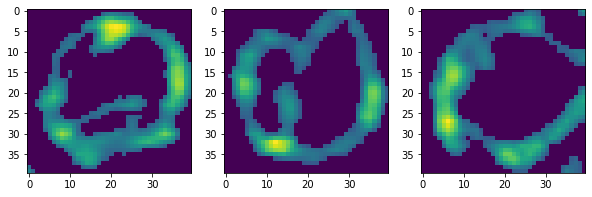

In [ ]:
f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (10,10))
ax1.imshow(val_set[1034]) 
ax2.imshow(val_set[5036])
ax3.imshow(val_set[625])

In [ ]:
output file in format 
read it through imagej and you can do a labeling function. 
record a marcro.
can look at the 7 latent spaces when shifted. 



In [ ]:
print(data_with_clusters.loc[1034,'Clusters']) #5376,13020,12388
print(data_with_clusters.loc[5036,'Clusters']) 
print(data_with_clusters.loc[625,'Clusters'])

10
10
10


In [ ]:
cox4circular = pd.read_csv(path+'/'+ 'cox4circularall.csv', sep = '\t')
#cox4circular = cox4circular.rename(columns={'Unnamed: 0': 'index'})
cox4circular = cox4circular.drop(columns='Unnamed: 0')
print(cox4circular.shape)


cox4aggrer = pd.read_csv(path+'/'+ 'cox4aggreall.csv', sep = '\t')
#cox4aggrer  = cox4aggrer .rename(columns={'Unnamed: 0': 'index'})
cox4aggrer = cox4aggrer.drop(columns='Unnamed: 0')
print(cox4aggrer.shape)


cox4senecent  = pd.read_csv(path+'/'+ 'cox4senecent.csv', sep = '\t')
cox4senecent  = cox4senecent .drop(columns='Unnamed: 0')
print(cox4senecent.shape)

(901, 7)
(142, 7)
(78, 7)


In [ ]:
l = [11810,4687,10191,12761,9400,12079,8652,4384,14654,6805,3072,9146,3992,416,8517,3276,10642,12764,9521,942,4507,6731,6947,13977,1396,797,2147,1463,2652,329,10866,14181,3236,9849,9550,1484]
x = filedf.iloc[l]


x = x.reset_index()
cox4circular = cox4circular.append(x)
cox4circular =cox4circular.drop_duplicates('file')

 

In [ ]:
l = [12126,1526,6528,2473,1701,5194,6619,4625,13010,10032,13408,13914,7933,11948,2409,11634,9214,9968,7707,4307,1588,7599,9425,4521,4545,11811,6772,3252,9368,11026,1407,8874,13437,7173,13260,1046,9242,10758,54,14501,12767,12748,189,14899,905,14337,13059,7273,14028,5680,9938,10903,7805,6114,2584,4272,4608,993,10671,655,10166,4393,7639,1099,13816,1484,7118,5029,10490,6064,9473]
x = filedf.iloc[l]
x= x.reset_index()

cox4aggrer= cox4aggrer.append(x)
cox4aggrer =cox4aggrer.drop_duplicates('file')
#cox4aggrer.to_csv('cox4aggreall.csv', sep = '\t')

 

In [ ]:
l =  [4562,9169,8119,12702,4760,9432,10125,8858,11032,14405,1916,6974,5485,7494,7345,610,3021,11559,8309,5893,9978,8608,4713,9486,14738,1968,6867,99,11743,4638,9192,14300,8319,11242,9645,4338,6516,6037,7527,12995,6295,12948,9044,14422,9453,14678,9173,6070,870,5682,4217,8998,1295,1901,253,10662,10600,12375,8246,13432,13230,1301,6076,12546,12908,3573,5964,9925,8251]
x = filedf.iloc[l]
x= x.reset_index()

cox4aggrer= cox4senecent.append(x)
cox4senecent =cox4senecent.drop_duplicates('file')
#cox4senecent.to_csv('cox4senecent.csv', sep = '\t')


In [ ]:
 len( data_with_clusters.loc[data_with_clusters['Clusters'] == clust].index)

706

In [ ]:
clust = 8
clusterindex = data_with_clusters.loc[data_with_clusters['Clusters'] == clust].index
#clusterindex = filedf.loc[(filedf['file'].isin(set(filedf.iloc[clusterindex]['file']) - set(cox4circular['file']) ))].index

for index in clusterindex: 
  f, ( ax2, ax3, ax4) = plt.subplots(1,3, figsize = (10,10))
 
  with torch.no_grad():
    img = torch.tensor(val_set[index].astype(np.float32) ).to(device).reshape(1,1,40,40) 
    _, outputori = model(img )
  outputoriimg = outputori.to('cpu').detach().numpy().reshape(40,40)
  cellname = filedf.iloc[index ]['file'].split('-')[0]
  name = cellname +'time_{}'.format(filedf.iloc[index ]['time'])


  
  # stupid piece of code to get the last number 
 

 
  #graphing 
  print((index))
 
  ax2.imshow(skimage.io.imread(path1+'/'+filedf.iloc[index]['file']))
  ax3.imshow(val_set[index])
  ax4.imshow(outputoriimg )

 
  ax2.set_title('{}'.format(name))
  ax3.set_title('Edited_index {}'.format(index)) #217,622,1080, 1977, 1028,1243,1852 not 3,17,1932
  ax4.set_title('VAECor cluster {}'.format(clust) )
  plt.tight_layout() # Senecent [4562,9169,8119,12702,4760,9432,10125,8858,11032,14405,1916,6974,5485,7494,7345,610,3021,11559,8309,5893,9978,8608,4713,9486,14738,1968,6867,99,11743,4638,9192,14300,8319,11242,9645,4338,6516,6037,7527,12995,6295,12948,9044,14422,9453,14678,9173,6070,870,5682,4217,8998,1295,1901,253,10662,10600,12375,8246,13432,13230,1301,6076,12546,12908,3573,5964,9925,8251]
  plt.show() #  
  plt.close()  

In [ ]:
for clust in sorted( data_with_clusters['Clusters'].unique()):
  clusterindex = data_with_clusters.loc[data_with_clusters['Clusters'] == clust].index
  f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (10,10))

  first = data_with_clusters.loc[clusterindex ].index[2]
  second = data_with_clusters.loc[clusterindex ].index[12]
  third = data_with_clusters.loc[clusterindex ].index[-2]
  ax1.imshow(val_set[first])
  ax2.imshow(val_set[second])
  ax3.imshow(val_set[third])
  
  ax1.set_title('cluster_{}'.format(clust) +'_index {}'.format(first))
  ax2.set_title('cluster_{}'.format(clust) +'_index {}'.format(second))
  ax3.set_title('cluster_{}'.format(clust) +'_index {}'.format(third))
  plt.show()
  plt.close()

In [ ]:
np.median(data_with_clusters.loc[clusterindex ].index)

1292.0

In [ ]:
np.median(data_with_clusters.loc[clusterindex ].index)

1470.0

## Conmparing Distrubitions of Different phenotypes
Here I am interested to see how the latent spaces are different. I will just be plotting graphs of the latent spaces

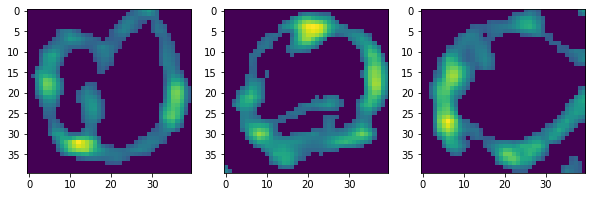

In [ ]:
f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (10,10))
ax1.imshow(val_set[1028])
ax2.imshow(val_set[217])
ax3.imshow(val_set[139])

Text(0.5, 0, 'number of latent spaces')

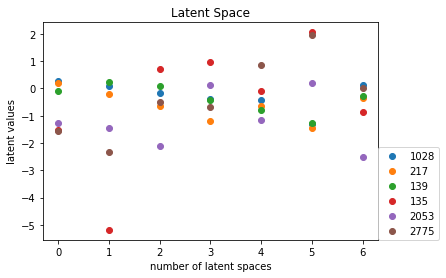

In [ ]:
l = [1028, 217, 139, 135, 2053, 2775 ]
fig, ax = plt.subplots()
for index in l:
  ax.scatter(pd.DataFrame(allindexdf.loc[index,'values']).index,pd.DataFrame(allindexdf.loc[index,'values']))
  ax.legend(l, loc=(1.0 ,0))
ax.set_title('Latent Space')
ax.set_ylabel('latent values')
ax.set_xlabel('number of latent spaces')

Text(0.5, 0, 'number of latent spaces')

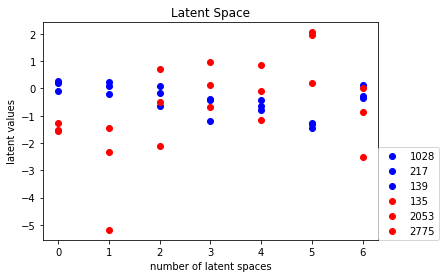

In [ ]:
l = [1028, 217, 139, 135, 2053, 2775  ]
l1 = [1028, 217, 139] # circular
l2= [135, 2053, 2775 ] # aggregates
"color coding two distinct phenotypes the circular and aggregate. There seems to be some variation in latent values that can be used"

fig, ax = plt.subplots()
for index in l:
  if index in l2:
     ax.scatter(pd.DataFrame(allindexdf.loc[index,'values']).index,pd.DataFrame(allindexdf.loc[index,'values']),  color='red')
  if index in l1:
    ax.scatter(pd.DataFrame(allindexdf.loc[index,'values']).index,pd.DataFrame(allindexdf.loc[index,'values']),color='blue')

  ax.legend(l, loc=(1.0 ,0))
ax.set_title('Latent Space')
ax.set_ylabel('latent values')
ax.set_xlabel('number of latent spaces')
 

In [ ]:
for index in l:
  plt.imshow(val_set[index])
  plt.title(index)
  plt.show()

In [ ]:
for index in indexdf['indexes']:
  f, (ax1, ax2) = plt.subplots(1,2, figsize = (10,10))
  ax1.imshow(val_set_nt[index])
  ax2.imshow(val_set[index])
  ax1.set_title(indexdf.loc[indexdf['indexes'] == index, 'corr'].values[0])
  ax2.set_title(index)
  plt.show()
  plt.close()

## Loading in a New Dataset 
Here I want to see how it peforms with the MDM38 dataset. Is it better or is it bad, we also see that there are these bright dots in mdm38.... is it reproducible ?

In [ ]:
!wget http:/~michael/mdm38_40x40.tar.gz -P /drive/STRP
!mkdir /drive/STRP/mito2/
!tar xvf /drive/STRP/mdm38_40x40.tar.gz -C /drive/STRP/mito2

In [ ]:
datainfo = 'mdm38_6_22_20'
path2 = filepath = '/drive/STRP/mito2/michael/public_html/MDM38_40x40/gfp/' # 
## load the Dataframes for Testing and train
traindf2 = pd.read_csv(os.getcwd()+'/'+'train_dataset_{}.csv'.format(datainfo), sep = '\t', index_col=0) # index_col loads it in with the index shuffled as is 
testdf2 =pd.read_csv(os.getcwd()+'/'+'test_dataset_{}.csv'.format(datainfo), sep = '\t', index_col=0)
filedf2 =pd.read_csv(os.getcwd()+'/'+'all_dataset_{}.csv'.format(datainfo), sep = '\t', index_col=0)
rlsdf2 = pd.read_csv(os.getcwd()+'/'+'mdm38_6_22_20_daughter_cells.csv', sep = '\t', index_col=0)
 

In [ ]:
testdf2 = testdf2 .sort_values(['cell', 'pos', 'time']) # to sort the dataframe 

In [ ]:
mdm38_set_nt2, d = loaddata(testdf2,path2, threshold = False ) # will load in the orginal data 
mdm38_set2, d = loaddata(testdf2,path2 ) # will load in the orginal data 

In [ ]:
"cerating DataFrame to house all the indexes "
indexlist = []
for index in range(mdm38_set2.shape[0]):
    with torch.no_grad():
      img = torch.tensor(mdm38_set2[index].astype(np.float32) ).to(device).reshape(1,1,40,40) 
      mulatent = model.encoder(img) # mean of latent spae and logvar of the enconder is returned 
    mulatent = mulatent.to('cpu').detach().numpy()
 
 
    cellname = testdf2.iloc[index ]['file'].split('-')[0]
    indexlist.append({'cellname':cellname, 'indexes': index, 'max_abs':np.max(np.abs(mulatent)), 'values':mulatent[0] })
 
mdm38indexdf = pd.DataFrame(indexlist)

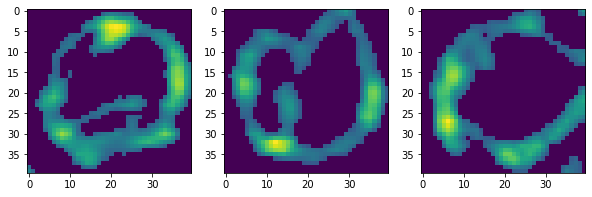

In [ ]:
f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (10,10))
ax1.imshow(val_set[1034]) 
ax2.imshow(val_set[5036])
ax3.imshow(val_set[625])

In [ ]:
"loading in train set data that does NOT have image augmentation to increase the amount of images, this will be the raw one so we can compare with the original file"
from scipy import stats
indexlist = []
for index in range(mdm38_set2.shape[0]):
    with torch.no_grad():
      img = torch.tensor(mdm38_set2[index].astype(np.float32) ).to(device).reshape(1,1,40,40) 
      mulatent = model.encoder(img) # mean of latent spae and logvar of the enconder is returned 
    mulatent = mulatent.to('cpu').detach().numpy()
    #indexes= np.where(np.max(np.abs(mulatent), axis = 1) <= .4)[0]
    #indexes= np.where(np.max((mulatent), axis = 1) <= .1)[0] # negatives

    ### Pearson correlation 
    m, b, r, p, sd = linregress(allindexdf.set_index('indexes').loc[1034,'values'],mulatent[0])
    m, b, r2, p, sd = linregress(allindexdf.set_index('indexes').loc[5036,'values'],mulatent[0])
    m, b, r3, p, sd = linregress(allindexdf.set_index('indexes').loc[625,'values'],mulatent[0])

    ### Kendaull correlation       
    #r,p = stats.kendalltau(allindexdf.set_index('indexes').loc[1028,'values'],mulatent[0])
    #r2,p = stats.kendalltau(allindexdf.set_index('indexes').loc[217,'values'],mulatent[0])
    #r3,p = stats.kendalltau(allindexdf.set_index('indexes').loc[139,'values'],mulatent[0])

    ### spearman correlation 
    #r,p = stats.spearmanr(allindexdf.set_index('indexes').loc[1028,'values'],mulatent[0])
    #r2,p = stats.spearmanr(allindexdf.set_index('indexes').loc[217,'values'],mulatent[0])
    #r3,p = stats.spearmanr(allindexdf.set_index('indexes').loc[139,'values'],mulatent[0])

 
    if ((r)< -.6) and ((r2)< -.6)  and ((r3)< -.6): # abs gets the opposite of the circles 
      cellname = testdf2.iloc[index ]['file'].split('-')[0]
      indexlist.append({'cellname':cellname, 'indexes': index, 'corr': [round(r,3), round(r2,3),round(r3,3)], 'max_abs':np.max(np.abs(mulatent)), 'values':mulatent[0] })
 
indexdf = pd.DataFrame(indexlist)

In [ ]:
indexdf.shape

(62, 5)

In [ ]:
for index in set(indexdf ['indexes'])  :
  f, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize = (10,10))
  with torch.no_grad():
    img = torch.tensor(mdm38_set2[index].astype(np.float32) ).to(device).reshape(1,1,40,40) 
    _, outputori = model(img )
  outputoriimg = outputori.to('cpu').detach().numpy().reshape(40,40)
  cellname = testdf2.iloc[index ]['file'].split('-')[0]
  name = cellname +'time_{}'.format(testdf2.iloc[index ]['time'])


  
  # stupid piece of code to get the last number 
  times = []
  for i in ((rlsdf2.loc[  cellname  ,  'time_budding' ] )).split(' '):
    try:
      times.append(int(i))
    except:
      pass

  maxval = (indexdf.loc[indexdf['indexes'] == index, 'corr'].values[0])
  #ax1.imshow(val_set_nt[index])
  # getting last bud
  pos = int(cellname.split('_')[1])
  cell = int(cellname.split('_')[3])
  if times[-1] <= 200 : # becasue we removed some buds
    lastbud = filedf2.groupby(['cell', 'pos', 'time']).get_group((cell, pos,times[-1]))['file'].values[0]
  else:
    lastbud = filedf2.groupby(['cell', 'pos', 'time']).get_group((cell, pos,times[-2]))['file'].values[0]

  #graphing 
  ax1.imshow(skimage.io.imread(path2+'/'+lastbud))
  ax2.imshow(skimage.io.imread(path2+'/'+testdf2.iloc[index]['file']))
  ax3.imshow(mdm38_set2[index])
  ax4.imshow(outputoriimg )

  ax1.set_title( 'lastbud {}'.format(times[-1]))
  ax2.set_title('{}'.format(name))
  ax3.set_title('Edited_index {}'.format(index)) #217,622,1080, 1977, 1028,1243,1852 not 3,17,1932
  ax4.set_title('VAECor {}'.format( (maxval)))
  plt.tight_layout()
  plt.show()
  plt.close()

# K means of the MdM38 data

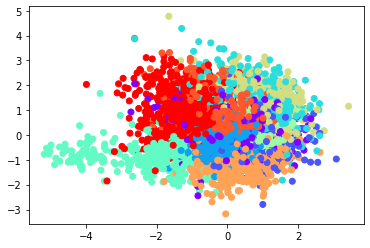

In [ ]:
latentdf = mdm38indexdf['values'].apply(pd.Series) # indexes should still match with allindexdf
df = latentdf.T.corr(method =  'pearson' )


from sklearn.cluster import KMeans
kmeans = KMeans(10, random_state=0) #34
kmeans.fit(latentdf)

identified_clusters = kmeans.fit_predict(latentdf)
identified_clusters


data_with_clusters = latentdf.copy()
data_with_clusters['Clusters'] = identified_clusters 
plt.scatter(data_with_clusters[0],data_with_clusters[5],c=data_with_clusters['Clusters'],cmap='rainbow')

In [ ]:
clust =6# 14 has circles 
len(data_with_clusters.loc[data_with_clusters['Clusters'] == clust].index)

1057

In [ ]:
clusterindex = data_with_clusters.loc[data_with_clusters['Clusters'] == clust].index
for index in clusterindex: 
  f, ( ax2, ax3, ax4) = plt.subplots(1,3, figsize = (10,10))
  with torch.no_grad():
    img = torch.tensor(mdm38_set2[index].astype(np.float32) ).to(device).reshape(1,1,40,40) 
    _, outputori = model(img )
  outputoriimg = outputori.to('cpu').detach().numpy().reshape(40,40)
  cellname = testdf2.iloc[index ]['file'].split('-')[0]
  name = cellname +'time_{}'.format(testdf2.iloc[index ]['time'])


  
  # stupid piece of code to get the last number 
 

 
  #graphing 
 
  ax2.imshow(skimage.io.imread(path2+'/'+testdf2.iloc[index]['file']))
  ax3.imshow(mdm38_set2[index])
  ax4.imshow(outputoriimg )

 
  ax2.set_title('{}'.format(name))
  ax3.set_title('Edited_index {}'.format(index)) #217,622,1080, 1977, 1028,1243,1852 not 3,17,1932
  ax4.set_title('VAECor cluster {}'.format(clust) )
  plt.tight_layout()
  plt.show()
  plt.close()

  

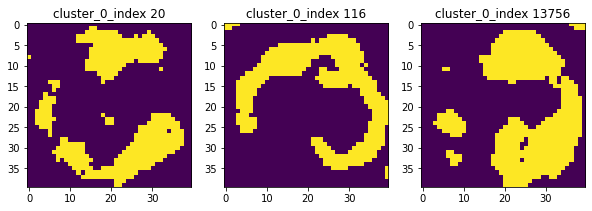

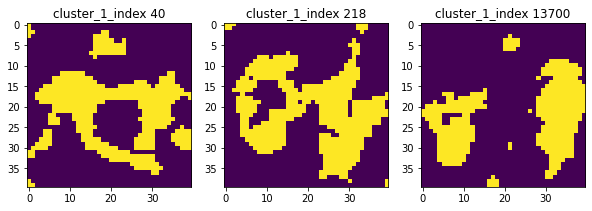

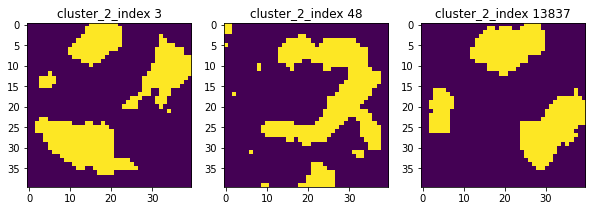

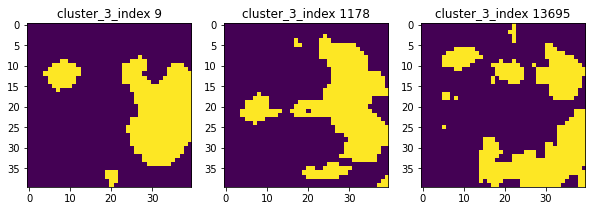

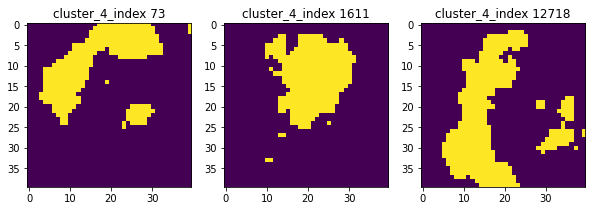

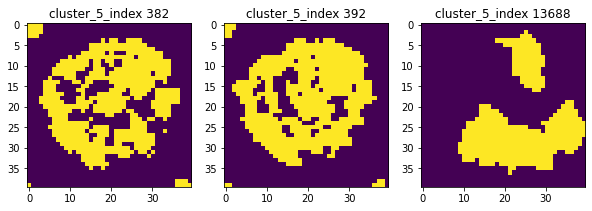

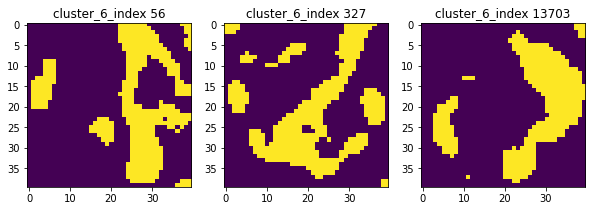

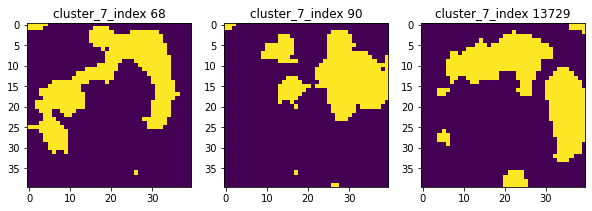

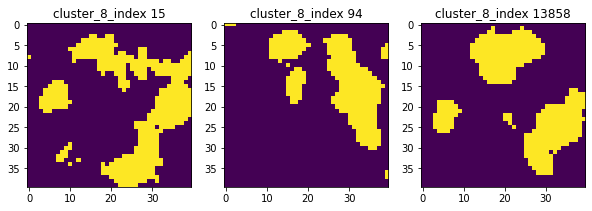

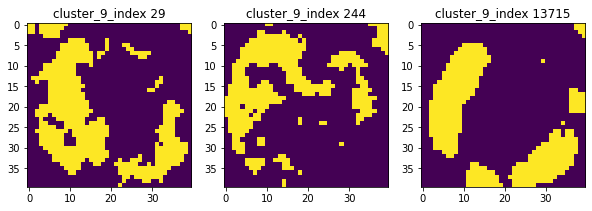

In [ ]:

for clust in sorted( data_with_clusters['Clusters'].unique()):
  clusterindex = data_with_clusters.loc[data_with_clusters['Clusters'] == clust].index
  f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (10,10))

  first = data_with_clusters.loc[clusterindex ].index[2]
  second = data_with_clusters.loc[clusterindex ].index[12]
  third = data_with_clusters.loc[clusterindex ].index[-2]
  ax1.imshow(mdm38_set2[first])
  ax2.imshow(mdm38_set2[second])
  ax3.imshow(mdm38_set2[third])
  
  ax1.set_title('cluster_{}'.format(clust) +'_index {}'.format(first))
  ax2.set_title('cluster_{}'.format(clust) +'_index {}'.format(second))
  ax3.set_title('cluster_{}'.format(clust) +'_index {}'.format(third))
  plt.show()
  plt.close()

# Regression of Lifespan and latent variables
Using the VAE I plan on identifying the latent spaces of each mitochondrial picture. From there I will do a linear regression between 

In [ ]:
latentdf = allindexdf['values'].apply(pd.Series) 
latentdf['cellname'] = allindexdf['cellname']
 

In [ ]:
from scipy import stats
rlsdf
l = []
for index in latentdf.index:
  cellname = latentdf.iloc[index]['cellname'] 
  time = filedf.iloc[index]['time']
  pos = filedf.iloc[index]['pos']
  cell = filedf.iloc[index]['cell']
  x = latentdf.iloc[index] [:7].values.astype(float)
  budsum = rlsdf.loc[cellname, 'budding_sum']
  y = list(range((budsum-6),(budsum +1)))  # 7 time ranges from last to budding sum and 6 back added a 1 so it includes the actual sum
 
 #regressions 
  m, b, r2, p, sd = linregress(x,y)
  spear,p = stats.spearmanr(x,y)
  r3,p = stats.kendalltau(x,y)
 
  l.append({'index': index, 'cellname': cellname, 'cell': cell, 'pos': pos, 'time': time,'budding_sum': budsum ,'pearson': r2,'spearman': spear, 'kendalltau':r3 })

reglatentdf = pd.DataFrame(l)

In [ ]:
reglatentdf

cox4circularall = pd.read_csv('cox4circularall.csv', sep = '\t')

cox4circularall.groupby(['cell', 'pos', 'time'])

In [ ]:
x = reglatentdf.groupby(['cell', 'pos', 'time'])
l = []
for index in cox4circularall.index:
 
  cell = cox4circularall.loc[index, 'cell']
  pos =cox4circularall.loc[index, 'pos']
  time =cox4circularall.loc[index, 'time']
  l.append(x.get_group((cell,pos,time))['index'].values[0])

In [ ]:
df =reglatentdf.loc[cox4circularall['index']]
df =df.reset_index()

In [ ]:
#df = reglatentdf.loc[reglatentdf['pearson'] < -.7]
for index in df['index']:
  f, (ax1, ax2) = plt.subplots(1,2, figsize = (10,10))
  ax1.imshow(skimage.io.imread(path1 + '/' +filedf.iloc[index]['file'] ))
  ax2.imshow(val_set[index])
  print(index)
  ax1.set_title(index)

  plt.show()
  plt.close() #  12797,12742,12589,12582,12559,12, 35, 325,385,419,459,545,687,771,801,810,881,930,942,976,1089,1103,1121,1214,1289,1294,1309,1345,1380,1390,1450,1556,1623,1630,1657,1743,1799,1800,2049,2108,2215,2238,2336,2359,2441,2453,2464,2499,2595,2656,2755,2773,2832,2852,2963,2973,3039,3085,3101,3210,3242,3319,3392,3461,3524,3549,3615,3633,3635,3707,3710,3723,3753,3761,3789,3816,3885,4012,4110,4138,4165,4224,4303,4332,4426,4474,4479,4623,4658,4674,4708,4738,4880,4900,4956,5014,5044,5078,5093,5190,5197,5244,5282,5293,5346,5502,5569,5641,5733,5800,5925,5927,5956,5967,5991,6117,6236,6256,6401,6442,6452,6465,6622,6628,6639,6659,6669,6709,6720,6767,6769,6788,6834,6896,6942,6958,7052,7087,7104,7127,7129,7201,7256,7304,7352,7437,7448,7546,7551,7573,7615,7665,7684,7762,7786,7810,7814,7827,7842,7898,7903,7985,7991,8039,8103,8117,8272,8360,8412,8456,8481,8485,8550,8557,8708,8728,8729,8810,8819,8850,8862,9001,9140,9173,9221,9223,9392,9420,9574,9631,9645,9656,9701,10007,10024,10026,10035,10146,10165,10215,10375,10422,10497,10524,10534,10537,10629,10637,10686,10816,10875,10911,10918,10943,10958, 10973,10992,11086,11089,11096,11138,11169,11243,11251,11254,11282,11295,11367,11425,11511,11534,11782,11808,11911,11999,12058,12059,12070,12114,12150,12241,12258,12280,12432,12449


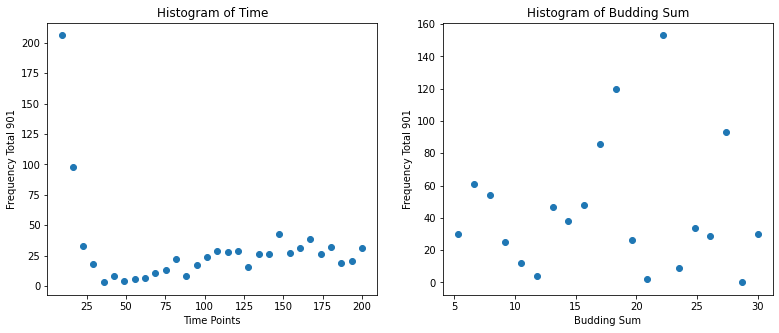

Text(0.5, 0, 'Budding Sum')

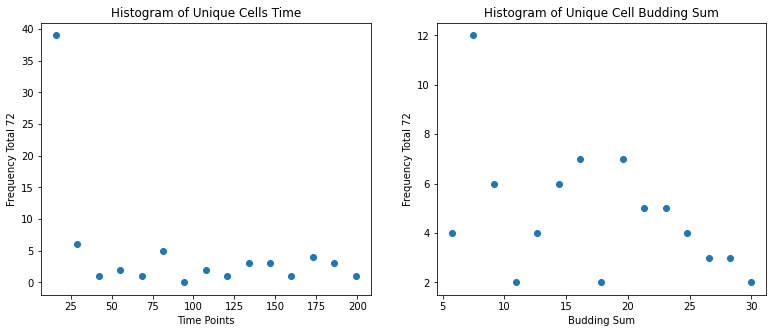

In [ ]:
f, (ax1, ax2) = plt.subplots(1,2, figsize = (13,5))
reg = 'pearson'
#df = reglatentdf.loc[reglatentdf[reg] < -.7]
df = reglatentdf.set_index('index')
df = df.loc[l]

hist, bins = np.histogram(df ['time'], 30)
ax1.scatter(bins[1:], hist)

hist, bins = np.histogram(df['budding_sum'], 20)
ax2.scatter(bins[1:], hist)

ax1.set_title('Histogram of Time')

ax2.set_title('Histogram of Budding Sum')

ax1.set_ylabel('Frequency Total {}'.format(df.shape[0]))
ax1.set_xlabel('Time Points')
ax2.set_ylabel('Frequency Total {}'.format(df.shape[0]))
ax2.set_xlabel('Budding Sum')

plt.show()
## Show histogram of unique cells Only sorting by highest absolute pearson 

df1 = df.copy()
df1['abs_val'] = df[reg].abs()
df1 = df1.sort_values('abs_val', ascending = False)
df1 = df1.drop_duplicates(subset='cellname', keep="first")

f, (ax1, ax2) = plt.subplots(1,2, figsize = (13,5))
hist, bins = np.histogram(df1 ['time'], 15)
ax1.scatter(bins[1:], hist)

hist, bins = np.histogram(df1['budding_sum'], 15)
ax2.scatter(bins[1:], hist)

ax1.set_title('Histogram of Unique Cells Time')

ax2.set_title('Histogram of Unique Cell Budding Sum')

ax1.set_ylabel('Frequency Total {}'.format(df1.shape[0]))
ax1.set_xlabel('Time Points')
ax2.set_ylabel('Frequency Total {}'.format(df1.shape[0]))
ax2.set_xlabel('Budding Sum')



In [ ]:
# explore the GFP level? 
# relation between the size and it
# those that had more circles did they live longer? have a larger area?
